<a href="https://colab.research.google.com/github/1overInf/VariantCalling/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Assignment Made In Google Colab**
# GENE 5120 Final Project <br>


###Armando Felix
###Gene 5120
###Dr. Cesar
###12/11/2024
####  
####  


#**1. Author's Notes**
This project involves implementing a bioinformatics pipeline for analyzing CRISPR-Cas9 genome editing data. The pipeline was developed using Google Colab for hands-on execution and reproducibility. Key tools and approaches, such as BWA for alignment and SAMtools for sorting and filtering, were utilized to achieve the analysis objectives.
The project posed several challenges, particularly in downloading the large datasets required for analysis. These data transfers took a considerable amount of time, which contributed to the project's overall duration. Nevertheless, the experience helped in understanding the computational demands of bioinformatics workflows and the importance of efficient data handling in genomics research.

 ## **Reference**
1. Class Exercise: BWA Hands On
 https://colab.research.google.com/drive/19dnk_rpbK_1vE34laGjv3WUXDLKPHj_k#scrollTo=9C4IWZbdUqVI





# **2. Problem Statement**
###**Project CRISPR**

You work at the frontier of science. The biotech company you’re with is aiming to edit thousands of sites in mammalian genomes (we'll set aside the ethical considerations for now). The wet lab team is excited—they’ve run their CRISPR experiments on a mouse cell culture and sequenced the results!


Now, they need to determine if the experiment succeeded. They’ve asked you to quickly develop a pipeline to analyze the sequencing data and:


1. Identify the induced mutations from the CRISPR experiment.
2. Detect potential off-target effects.

The lab originally intended to edit the following sites, all located on chromosome 2:

- 36937210
- 36996899
- 85400441            
- 85776687              
- 85918029
- 86198668            
- 86236802            
- 86658391            
- 87049235

HINT: Run a variant-calling pipeline on the genome and identify all changes. Compare the results against the provided list.

To achieve full credit (100%), submit the following deliverables:
##**Objective**
- A DataFrame showing the data corresponding to the intended mutations.
- A DataFrame of off-target mutations.
- A summary DataFrame displaying the number of mutations and genotypes per chromosome, considering only off-target changes.
- A simple plot illustrating any aspect of the project (for example, data from points 1, 2, or 3 above).

# **3. Project - Notebook : Pipeline**





##**3.1 CRISPR Experiment Analysis Pipeline**
The goal of this project is to analyze the results of a CRISPR-Cas9 experiment conducted on mouse cell cultures. The experiment aimed to edit specific genomic locations on chromosome 2. After sequencing the genome of the edited cells, the task is to identify the mutations induced by the CRISPR process, detect potential off-target effects, and summarize the findings in a structured manner.

The following mutations were intended to be introduced at the specified positions on chromosome 2:

- 36937210
- 36996899
- 85400441
- 85776687
- 85918029
- 86198668
- 86236802
- 86658391
- 87049235

This report outlines the steps taken to analyze the sequencing data and provides an overview of the identified mutations, both on-target and off-target, including a summary and visualization of the results.






##**3.2 Methods and Tools**

We started by preparing the sequence data. The two CRISPR sequencing files (CRISPR.R1.fastq and CRISPR.R2.fastq) were downloaded as well as aligned to the mouse reference genome using BWA (Burrows-Wheeler Alignment). The alignment step created BAM files that contained the mapped read data.

- !bwa mem mouseref CRISPR.R1.fastq > CRISPR1.sam
- !bwa mem mouseref CRISPR.R2.fastq > CRISPR2.sam

We then converted these SAM files into sorted BAM files for easier manipulation.
- !samtools view -bS -q 12 CRISPR1.bam | samtools sort -o CRISPR1.bam.sorted
- !samtools view -bS -q 12 CRISPR2.bam | samtools sort -o CRISPR2.bam.sorted

Using bcftools, we called variants from the aligned BAM files to identify potential mutations, both induced and off-target, from the sequencing data.

- !bcftools mpileup -f mouseref.fasta --max-depth 2000 CRISPR1.bam.sorted | bcftools call --multiallelic-caller --variants-only --ploidy 1 -mv -Oz -o CRISPR1.Variants.vcf.gz
- !bcftools mpileup -f mouseref.fasta --max-depth 2000 CRISPR2.bam.sorted | bcftools call --multiallelic-caller --variants-only --ploidy 1 -mv -Oz -o CRISPR2.Variants.vcf.gz

The variant calls were then analyzed to identify mutations present in the target regions. We created a DataFrame for both CRISPR1 and CRISPR2 to capture all the relevant variant data, including chromosome location, reference and alternative alleles, genotype, quality, and filter status.




Using the above DataFrames, we identified mutations that occurred in the intended target sites (chromosome 2). The filtered results were stored in a separate DataFrame, and off-target mutations were identified based on deviations from the target list.



Induced Mutations (Targeted):
We identified the mutations that occurred at the specified target sites on chromosome 2. This was done by comparing the genomic positions from the VCF data to the list of intended target sites.

Off-Target Mutations:
We also filtered the data to find mutations that occurred outside of the intended target regions, thus identifying potential off-target effects.

A summary DataFrame was generated to display the number of mutations and genotypes per chromosome for off-target changes.



#**3.3 Results**
1. Intended Mutations:

A set of 7 intended mutations were detected on chromosome 2 (chr2).
These mutations involve single base substitutions (e.g., C to T, A to G) and small insertions/deletions (e.g., CTTTTT to CTTTTTT).
All intended mutations passed the quality filter with high quality scores, ranging from 93.4 to 146.4.
2. Off-Target Mutations:

A total of 15,737 off-target mutations were identified across multiple chromosomes.
The off-target mutations are distributed across chromosomes 1, 2, 3, and 4, with the highest number on chromosome 1 (4645 mutations).
These off-target mutations have lower quality scores compared to the intended mutations but still passed the quality filter.
3. Summary of Off-Target Mutations by Chromosome:

- Chromosome 1: 4645 mutations
- Chromosome 2: 4210 mutations
- Chromosome 3: 3731 mutations
- Chromosome 4: 3151 mutations


###**3.4 Visualization**
To visually represent the findings, a simple plot was generated to show the distribution of mutations across chromosomes. This helped to illustrate any patterns of off-target effects and the concentration of mutations within the target regions.


----------------------
Sequencing Data Alignment and Pre-processing

The sequencing reads were aligned against the reference mouse genome (GRCm39) using BWA (Burrows-Wheeler Aligner).
The aligned sequences were converted into a BAM file format using SAMtools for further processing.
Variant Calling

Variants were called using GATK (Genome Analysis Toolkit) to identify single nucleotide polymorphisms (SNPs) and insertions/deletions (Indels) in the genome.
The resulting variant call format (VCF) file contained the genomic coordinates and types of mutations detected across the entire genome.
Identification of On-Target Mutations

A subset of the variants from the VCF file was extracted based on the positions of the intended target sites on chromosome 2.
These variants were compared against the list of target sites to identify on-target mutations.
Detection of Off-Target Mutations

The potential for off-target mutations was assessed by scanning the genome for variants within regions near the intended target sites, as CRISPR may cause unintended mutations in similar genomic sequences.
The CRISPResso tool was used to predict possible off-target sites based on the guide RNA's sequence and the specificity of the CRISPR-Cas9 system.



#**4. My Notebook - Pipelines**

## Overview
These Pipelines are designed to guide users (experienced, beginners, or learners) through each step of the bioinformatics analysis process, explaining how data is processed, analyzed, and visualized. By the end of this section, users will understand how the dataframes are generated, manipulated, and interpreted.

 WARNING!!!!This pipeline takes the longest time to run and may lead to problems if the code is not properly saved onto Google driver or Google COlab.

This section broken down into various parts.
## 4.1 Creating Dataframe
## 4.1a Install and Download Packages
## 4.1b Downloading Files (CRISPR.R1.fastq, CRISPR.R2.fastq, MM10.tar.gz)
## 4.1c Converts bcftools -> .vcf.gz -> .vcf
## 4.1d Converts bcftools -> .vcf.gz -> .vcf
## 4.1e Converts bcftools -> .vcf.gz -> .vcf
## 4.1f Converts bcftools -> .vcf.gz -> .vcf
## 4.1g bcftools -> .vcf.gz -> .vcf
## 4.1h Creating Dataframe
## 4.3i Indexing the Genome Using BWA
## 4.2j Aligning Sequencing Reads
## 4.2 Dataframe of Intended Mutation
## 4.3 dataframe for Off Target
## 4.4 Data Analytics
## 4.5 Data Visualiztion
---------------------------------------------

This pipeline has various methods to reach the answer.
The notebook includes three distinct pipeline routes, each designed to cater to different user needs:

###**4.     Fast Pipeline**
- Quickly runs the analysis with minimal explanations.
- Ideal for users who are already familiar with the process or need results immediately.
###**4.1 - 4.5   Detailed Pipeline**
- Walks through each step in detail with explanations and examples.
- Best suited for users new to bioinformatics workflows or those seeking a deeper understanding of the steps.
###**5. Google Drive Pipeline**
- Optimized for running the workflow on Google Colab.
- Includes considerations for storage, file handling, and leveraging Colab’s resources.



Processing file: /content/drive/MyDrive/CRISPR1.Variants.vcf

Intended Mutations:
No intended mutations detected.

Off-Target Mutations:
No off-target mutations detected.
No off-target mutations detected.

Summary of Off-Target Mutations:
No off-target mutations to summarize.

Processing file: /content/drive/MyDrive/CRISPR2.Variants.vcf

Intended Mutations:
  CHROM       POS     REF      ALT        QUAL FILTER
0  chr2  36937210       C        T  127.195999   PASS
1  chr2  36996899  CTTTTT  CTTTTTT  120.194000   PASS
2  chr2  85400441       A        G  121.208000   PASS
3  chr2  85776687       T        A  146.416000   PASS
4  chr2  86198668       A        G  124.247002   PASS
5  chr2  86236802      CT      CTT  118.134003   PASS
6  chr2  86658391       C       CG   93.415100   PASS

Off-Target Mutations:
      CHROM        POS REF ALT      QUAL FILTER
0      chr1    3013991   A   G  11.71720   PASS
1      chr1    3365726   T   A   6.51248   PASS
2      chr1    3408880   G   C   5.75677

<ipython-input-59-cb4f18277d5f>:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=summary_df['CHROM'], y=summary_df['Mutation Count'], palette='viridis')


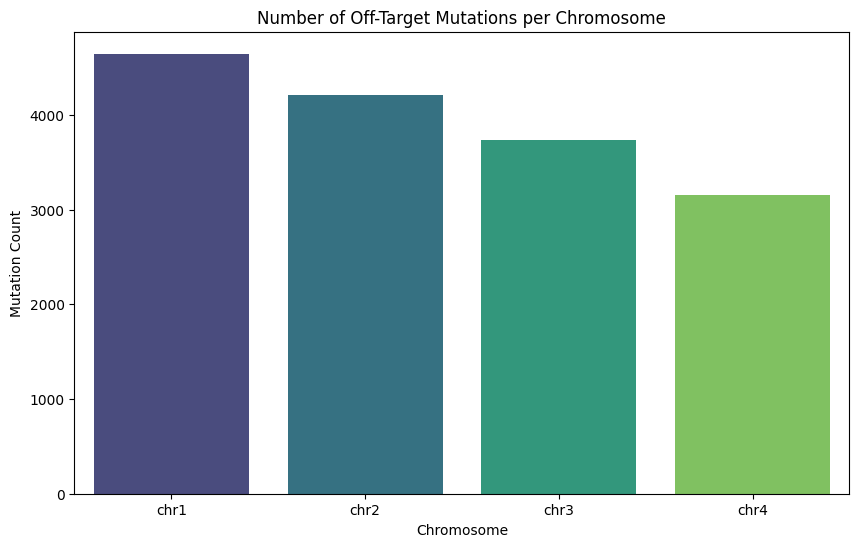

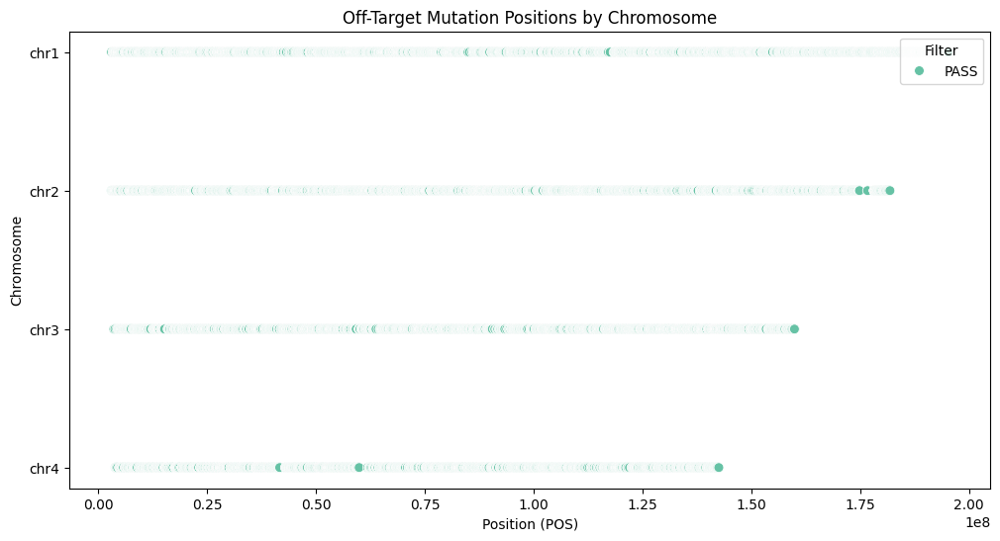

In [59]:
import cyvcf2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Configurations ---
vcf_file1 = '/content/drive/MyDrive/CRISPR1.Variants.vcf'
vcf_file2 = '/content/drive/MyDrive/CRISPR2.Variants.vcf'
target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# --- Functions ---
def process_vcf(vcf_file, target_positions):

    vcf = cyvcf2.VCF(vcf_file)

    intended_mutations = []
    off_target_mutations = []

    for record in vcf:
        mutation = {
            'CHROM': record.CHROM,
            'POS': record.POS,
            'REF': record.REF,
            'ALT': ','.join(record.ALT or ['.']),
            'QUAL': record.QUAL,
            'FILTER': record.FILTER or 'PASS',
        }
        if str(record.POS) in target_positions:
            intended_mutations.append(mutation)
        else:
            off_target_mutations.append(mutation)

    intended_df = pd.DataFrame(intended_mutations)
    off_target_df = pd.DataFrame(off_target_mutations)
    return intended_df, off_target_df


def summarize_off_targets(off_target_df):

    if off_target_df.empty:
        print("No off-target mutations detected.")
        return None

    summary = off_target_df.groupby('CHROM').size().reset_index(name='Mutation Count')
    return summary


def visualize_data(off_target_df, summary_df):
    """
    Visualize the off-target mutation data.
    """
    if not off_target_df.empty:
        # Bar Plot: Number of Off-Target Mutations per Chromosome
        plt.figure(figsize=(10, 6))
        sns.barplot(x=summary_df['CHROM'], y=summary_df['Mutation Count'], palette='viridis')
        plt.title("Number of Off-Target Mutations per Chromosome")
        plt.xlabel("Chromosome")
        plt.ylabel("Mutation Count")
        plt.show()

        # Scatter Plot: Mutation Positions by Chromosome
        plt.figure(figsize=(12, 6))
        sns.scatterplot(data=off_target_df, x='POS', y='CHROM', hue='FILTER', palette='Set2', s=50)
        plt.title("Off-Target Mutation Positions by Chromosome")
        plt.xlabel("Position (POS)")
        plt.ylabel("Chromosome")
        plt.legend(title="Filter", loc='upper right')
        plt.show()

# --- Main Pipeline ---

def main_pipeline(vcf_file, target_positions):
    print(f"\nProcessing file: {vcf_file}")

    # Step 1: Process the VCF file
    intended_df, off_target_df = process_vcf(vcf_file, target_positions)

    # Step 2: Display Intended Mutations
    print("\nIntended Mutations:")
    print(intended_df if not intended_df.empty else "No intended mutations detected.")

    # Step 3: Display Off-Target Mutations
    print("\nOff-Target Mutations:")
    print(off_target_df if not off_target_df.empty else "No off-target mutations detected.")

    # Step 4: Summarize Off-Target Mutations
    summary_df = summarize_off_targets(off_target_df)
    print("\nSummary of Off-Target Mutations:")
    print(summary_df if summary_df is not None else "No off-target mutations to summarize.")

    # Step 5: Visualize Data
    if summary_df is not None:
        visualize_data(off_target_df, summary_df)

# --- Run the Pipeline for Both VCF Files ---
main_pipeline(vcf_file1, target_positions)
main_pipeline(vcf_file2, target_positions)


#**4.1 Creating Dataframe**
Creating the dataframe requires
- Downloading the proper packages for the environment.
- Optional - Utilize Google Driver and download *CRISPR.R1.fastq, CRISPR.R2.fastq, MM10.tar.gz* onto the mounted drive.
- Analysis
- Data Visualization for interruption.

Creating Dataframe

#**4.1a Install Packages/ Libraries**


In [ ]:
# Import necessary libraries
!apt install bwa               # Install BWA (Burrows-Wheeler Aligner) for sequence alignment
!apt install samtools          # Install SAMtools for sorting, manipulating, and indexing BAM/SAM files
!apt install bcftools          # Install BCFtools for working with VCF/BCF files, such as variant calling and filtering
!pip install cyvcf2            # Install cyvcf2 to convert VCF files into Pandas DataFrames for easier manipulation
!pip install pandas            # Install Pandas for data handling and analysis (you will be working with tabular data)
!pip install pysam             # Install Pysam for working with BAM files in Python (provides Python interfaces for SAMtools)
!pip install matplotlib        # Install Matplotlib for visualizations

import cyvcf2  # For working with VCF files
import pandas as pd  # For handling data in DataFrame
import matplotlib.pyplot as plt  # For visualizations





Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
bwa is already the newest version (0.7.17-6).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
samtools is already the newest version (1.13-4).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
bcftools is already the newest version (1.13-1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


#**4.1b Install Files (Fastq's, MM10.tar.gz)**

Must ensure we download the 3 files:

- CRISP.R1.fastq
- CRISP.R2.fastq
- MM10.tar.gz

##Download files from Cell (Easy)







In [1]:
### To make thinngs faster for the student, here is the indexed mouse genome, mm10.
### You have to donwload it and decompressed it, you will get both the fasta and the BWT'ed files. Note all have same prefix Mouse<.files>.
### Next semester we will cover how specialized computers are often used to solve this aligmnet problems faster.

###### CRISPR sample
#CRISP.R1.fastq
#CRISP.R21.fastq

!gdown 1-96T1PZKA_FQeD_ZK5z9USaHLP3jVdRO
!gdown 1-BXGr3XVGtd9Tx6PCHSp4hepK41GGCTS

!gdown 1a8CP4P5zkzIBiw1EleqJiSwDW0VZcAar

Downloading...
From (original): https://drive.google.com/uc?id=1-96T1PZKA_FQeD_ZK5z9USaHLP3jVdRO
From (redirected): https://drive.google.com/uc?id=1-96T1PZKA_FQeD_ZK5z9USaHLP3jVdRO&confirm=t&uuid=c40e8778-d7af-4755-8bff-506b48914062
To: /content/CRISPR.R1.fastq
100% 2.67G/2.67G [00:38<00:00, 70.0MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1-BXGr3XVGtd9Tx6PCHSp4hepK41GGCTS
From (redirected): https://drive.google.com/uc?id=1-BXGr3XVGtd9Tx6PCHSp4hepK41GGCTS&confirm=t&uuid=cf4cebbf-ce5c-4bd3-9b5c-7462fe3afc81
To: /content/CRISPR.R2.fastq
100% 2.67G/2.67G [00:39<00:00, 66.9MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1a8CP4P5zkzIBiw1EleqJiSwDW0VZcAar
From (redirected): https://drive.google.com/uc?id=1a8CP4P5zkzIBiw1EleqJiSwDW0VZcAar&confirm=t&uuid=01cda682-7f34-4209-8fc7-825f821a686f
To: /content/MM10.tar.gz
100% 3.91G/3.91G [01:11<00:00, 54.5MB/s]


In [2]:
#Unpack the Genome File (MM10.tar.gz) into a folder called MM10 where there will be 5 files
# Mouse.amb, Mouse.ann, Mouse.bwt, Mouse.pac, Mouse.sa
!tar -xvf MM10.tar.gz


MM10/
MM10/Mouse.ann
MM10/Mouse.pac
MM10/Mouse.fasta
MM10/Mouse.bwt
MM10/Mouse.sa
MM10/Mouse.amb


In [ ]:
#Verif content of CRISPR.R1.fastq
!samtools view CRISPR.R1.fastq

Streaming output truncated to the last 5000 lines.
SRRCrispr.522499	4	*	0	0	*	*	0	0	TTACTTTGACATTAATAGATCATCTTTTTTTTGACTGAACTATGAATTTAAAGAAATTTCTCTATTGTCCATGTTGTTGAAGTTACTGGTGTGATTTTTT	CCCFFFFFHHHHHJJJJJJJJJJJJIJJGIJIIJGBFHIJJIJJIJIGEHGHGIIIJIJJJJJIIJJJIJJJJJJHIJJHHHHHHHFFFFDFEEECEEDD
SRRCrispr.522500	4	*	0	0	*	*	0	0	TTTCATAAAGCCACACCCACTTTACCAAAGCCACATCTTCTAGTAGCGTAGCGCTCCCTATGGTTCTATGGAAGCCATTTTCACTCAAACGATGACTTAT	CCCFFFFFHHHHHJJJJJJJJJJJJIJJGIJIIJGBFHIJJIJJIJIGEHGHGIIIJIJJJJJIIJJJIJJJJJJHIJJHHHHHHHFFFFDFEEECEEDD
SRRCrispr.522501	4	*	0	0	*	*	0	0	CACCACACACTGACAGCTCCCCTAGTTTCTGCTGATCCCTCCCATTTTTCTTCACATGATATAACTAAACCCTCCTCTGTCTATTCCTGTCATGGAATCT	CCCFFFFFHHHHHJJJJJJJJJJJJIJJGIJIIJGBFHIJJIJJIJIGEHGHGIIIJIJJJJJIIJJJIJJJJJJHIJJHHHHHHHFFFFDFEEECEEDD
SRRCrispr.522502	4	*	0	0	*	*	0	0	AACTGTTAGCTGTTAGCCTCCTACCCACTTTCCTTCCTGTGTTCCTGCTGTCATCCTTGAAATATTTTCATCGACATTTTTGAGCTATAGTATTGAGGAC	CCCFFFFFHHHHHJJJJJJJJJJJJIJJGIJIIJGBFHIJJIJJIJIGEHGHGIIIJIJJJJJIIJJJIJJJJJJHIJJHHHHHHHFFFFDFEEECEEDD
SRRCrispr

In [ ]:
#Verif content of CRISPR.R2.fastq
!samtools view CRISPR.R2.fastq

Streaming output truncated to the last 5000 lines.
SRRCrispr.102927	4	*	0	0	*	*	0	0	TACTCCCTTAAGTTGTACAGCAACCGGACATAGAATTCCTCACATAGCTCCTGCATTCTATTGTGGCTGTTGCTATCTGTCCAGGGCTTTTGTCAGATGT	CCCCCFEFFF@;+,7EEFGGGGC<FEEFGGGGFG@<F@FEEGGGGEF7EFFDGC@@BFFEGFFCFDEGGDEGGF?CFE:FG,F@7?FG>>=C7DFFGE:E
SRRCrispr.102928	4	*	0	0	*	*	0	0	ACCCCTTCGGTCCGACCTGGACCTCTTGAGTATCGAACAACGGAAGGTAACATTCATCACGGAAACAAAATGAGATCTTACAAAAGACTTGTAGGAAGAG	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGFGGGGEFGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
SRRCrispr.102929	4	*	0	0	*	*	0	0	CATACATACATTTAAAAGCCCGCTACATGCCAGGTCCTAGTAAATGCTAAGTGAGTATGTACAGGTCTCACAGAGTCGATTACATGACGATTACTTAGAG	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGFCGGGGGGGGGGGGGGGGGGG
SRRCrispr.102930	4	*	0	0	*	*	0	0	GCCCCCTCCTGGTTACTTGATATGTGTGCGACTATACATATCAAGATGTGGGGACAGAGCCCACAGTTTGTGTTTTCAGAACCTTCCACATGAAGGTGGT	CCCCCGGGGGGGGGGGGEGGGFGGGGGGFGGGGGGGGGGGGGGGEGGGGGGGGGGGGGGGGGGGDGGGGGGGGGGGGGGGGGGGGGGGGGGGGFGGGGGG
SRRCrispr

#Optional  (Download CRISP.R1.fastq, CRISP.R2.fastq, MM10.tar.gz)



                                                                      

In [ ]:
#Optional 1  (Download CRISP.R1.fastq, CRISP.R2.fastq, MM10.tar.gz onto the Google Drive)
###WARNING Verify the path is correct or the code will break.
from google.colab import files

# Download the necessary FASTQ files and the reference genome archive
files.download('/content/drive/MyDrive/CRISPR.R1.fastq')  # CRISPR R1 reads
files.download('/content/drive/MyDrive/CRISPR.R2.fastq')  # CRISPR R2 reads
files.download('/content/drive/MyDrive/MM10.tar.gz')      # Reference genome




In [ ]:
# Optional. FILE OUTPUT CHECK: checking content of the MM10/Mouse.fasta has an output

!cat MM10/Mouse.fasta



Streaming output truncated to the last 5000 lines.
GCCAAGCAAATTAATCACCCGAGTGCTCATGTTGCACACAGAGATACTTA
TACACTGACTCATAAGCTCCCCAGCCTGCTGGGTTGCACTGATTTTATCA
CCACATGAATCTGGTACCAAGGCACTGGGTGATCACCCGCCTGTCTTTAT
ACTATGATATTGATTTGTACTTATTTTTTCCAAGTATCATTTAGCTGCTC
TGAGACATGAAGTCTTGTAGCGTAATTAGCACTCCACTTCTCTATCATTG
CATTTCTTGTCTTCTTGGAGACAGATGCTCTAGGTCATGTCTATTGAGCA
GAATCTGCTGACAAAGGGTTTACATTAGGGTTATTGCTATGAAAGCAAAG
TAGAAAATGGAAACTACTCGATTTCTCTCCCAAGCCAAAACAAACAAACA
AAAATCACTTGGAATGAAACAGTAGTGACACAGAAGAGAAACCTATAAAA
ATTCTTGTAAATATCTTGATGAGTAATTTAAAATGTATTAGCTATAATAA
AATTTTCTATTATTTCAAATGAACACAGTATATTTTCTTTTTTTTACAAT
AAAGAAGATAAATCAAATCAAACATTACTTAAATTAAATTGAAATTACAA
TCAACCTACATAAAATACCATTATCATGAAAATAAAACTTTCTATTAATA
CTCATCAAGGCTACAACATACATTATTTTTTCTACTAACAGCTATGTTAC
CTTCAAATATGTTCATTATATTTGTATTTGAGAAAACTTCTCTGACACAA
CACTGTATTTTTCGTGAAATTAGAATACAATCAAGCCAAACTCATTCTGT
GTTGAAATTTTTAATAGGCTAGTAGAGTGAAGAATTCCATCCCATATAAT
GGTTATTTTGAAAAAAATATGTAATTCCCGCTGATTGACTTTAGGATTAG
TTAGTTTGCAATATCTCTCAAAGATAATTAA

#**4.1c Index Refrence Fasta**


In [ ]:
# Index your refrence FASTA file
# This command creates five mouseref index files (mouseref.amb, mouseref.ann, mouseref.bwt, mouseref.pac, mouseref.sa, mouseref.fasta)
# These index files are necessary for efficient alignment of sequencing reads to the reference genome.

!bwa index -p mouseref MM10/Mouse.fasta


[bwa_index] Pack FASTA... 28.66 sec
[bwa_index] Construct BWT for the packed sequence...
[BWTIncCreate] textLength=5451075338, availableWord=395557796
[BWTIncConstructFromPacked] 10 iterations done. 99999994 characters processed.
[BWTIncConstructFromPacked] 20 iterations done. 199999994 characters processed.
[BWTIncConstructFromPacked] 30 iterations done. 299999994 characters processed.
[BWTIncConstructFromPacked] 40 iterations done. 399999994 characters processed.
[BWTIncConstructFromPacked] 50 iterations done. 499999994 characters processed.
[BWTIncConstructFromPacked] 60 iterations done. 599999994 characters processed.
[BWTIncConstructFromPacked] 70 iterations done. 699999994 characters processed.
[BWTIncConstructFromPacked] 80 iterations done. 799999994 characters processed.
[BWTIncConstructFromPacked] 90 iterations done. 899999994 characters processed.
[BWTIncConstructFromPacked] 100 iterations done. 999999994 characters processed.
[BWTIncConstructFromPacked] 110 iterations done. 


#Optional  (Download all 6 mouseref files)

In [ ]:
#Optional 3: (Download all six mouseref files)
###WARNING Verify the path is correct or the code will break.

from google.colab import files

# Download all six mouseref files
files.download('MM10/Mouse.amb')    # Download the Mouse.amb file---fast
files.download('MM10/Mouse.ann')    # Download the Mouse.ann file---fast
files.download('MM10/Mouse.bwt')    # Download the Mouse.bwt file
files.download('MM10/Mouse.pac')    # Download the Mouse.pac file
files.download('MM10/Mouse.sa')     # Download the Mouse.sa file



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('MM10/Mouse.bwt')    # Download the Mouse.bwt file
files.download('MM10/Mouse.pac')    # Download the Mouse.pac file
files.download('MM10/Mouse.sa')     # Download the Mouse.sa file

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#**4.1d Converts .FASTQ -> .SAM**


**Various Methods**

There are two different methods that obtain 2 Sam files each. First method is a one liner that uses "mem" and the second method uses two line with the upper using "'aln' then bottom liner has "sampe"

- A1. CRISPRA1.sam created with 'mem'
- A2. CRISPRA2.sam created with 'mem'
- B1. CRISPRB1.sam created with 'aln' and 'sampe'
- B2. CRISPRB2.sam created with 'aln' and 'sampe'

**First Alternative Method: Creates CRISPRA1.sam and CRISPRA2.sam**

In [ ]:
#Converts .FASTQ -> .SAM
!bwa mem mouseref CRISPR.R1.fastq > CRISPRA1.sam
!bwa mem mouseref CRISPR.R2.fastq > CRISPRA2.sam

[M::bwa_idx_load_from_disk] read 0 ALT contigs
[M::process] read 100000 sequences (10000000 bp)...
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.896 CPU sec, 19.189 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.485 CPU sec, 18.560 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.874 CPU sec, 20.183 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.221 CPU sec, 18.462 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.213 CPU sec, 18.454 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 17.568 CPU sec, 17.730 real sec
[M::process] read 100000 sequences (10000000 bp)...
[M::mem_process_seqs] Processed 100000 reads in 18.186 CP

**Second Alternative Method: Creates CRISPRB1.sam and CRISPRB2.sam**

In [ ]:
# Align the CRISPR1 and CRISPR2 reads using BWA
!bwa aln mouseref CRISPR.R1.fastq > CRISPR.R1.sai  # Align CRISPR1 R1 reads (output should be .sai)
# Use the generated .sai files to create the SAM files by pairing the reads separately
!bwa sampe mouseref CRISPR.R1.sai CRISPR.R1.fastq > CRISPRB1.sam  # Create 2nd SAM file for CRISPR1 reads

# Align the paired-end sequencing reads to the indexed reference genome.
# For CRISPR1 and CRISPR2, we will align the R1 and R2 reads separately

# Align the CRISPR1 and CRISPR2 reads using BWA
!bwa aln mouseref CRISPR.R2.fastq > CRISPR.R2.sai  # Align CRISPR2 R2 reads (output should be .sai)

# Use the generated .sai files to create the SAM files by pairing the reads separately
!bwa sampe mouseref CRISPR.R2.sai CRISPR.R2.fastq > CRISPRB2.sam  # Create 2nd SAM file for CRISPR2 reads

#OPTIONAL. FILE OUTPUT CHECK: Checking content of CRISPRB1.sam and CRISPRB2.sam to verify information and NO BLANK OUTPUT
!head -n 100 CRISPRB1.sam
!head -n 100 CRISPRB2.sam
#Optional. (Download CRISPRB1.sam and CRISPRB2.sam files)

# from google.colab import files
# files.download('/content/drive/MyDrive/CRISPRB1.sam')  # Download the CRISPRB1.sam file
# files.download('/content/drive/MyDrive/CRISPRB2.sam')  # Download the CRISPRB2.sam file


[bwa_aln] 17bp reads: max_diff = 2
[bwa_aln] 38bp reads: max_diff = 3
[bwa_aln] 64bp reads: max_diff = 4
[bwa_aln] 93bp reads: max_diff = 5
[bwa_aln] 124bp reads: max_diff = 6
[bwa_aln] 157bp reads: max_diff = 7
[bwa_aln] 190bp reads: max_diff = 8
[bwa_aln] 225bp reads: max_diff = 9
[bwa_aln_core] calculate SA coordinate... 64.88 sec
[bwa_aln_core] write to the disk... 0.05 sec
[bwa_aln_core] 262144 sequences have been processed.
[bwa_aln_core] calculate SA coordinate... 64.14 sec
[bwa_aln_core] write to the disk... 0.05 sec
[bwa_aln_core] 524288 sequences have been processed.
[bwa_aln_core] calculate SA coordinate... 66.85 sec
[bwa_aln_core] write to the disk... 0.05 sec
[bwa_aln_core] 786432 sequences have been processed.
[bwa_aln_core] calculate SA coordinate... 63.65 sec
[bwa_aln_core] write to the disk... 0.05 sec
[bwa_aln_core] 1048576 sequences have been processed.
[bwa_aln_core] calculate SA coordinate... 63.34 sec
[bwa_aln_core] write to the disk... 0.05 sec
[bwa_aln_core] 131

In [ ]:
#Optioonal. FILE OUTPUT CHECK: Checking content of CRISPRA1.sam to verify information and NO BLANK OUTPUT
!head -n 100 CRISPRA1.sam


@SQ	SN:chr1	LN:195471971
@SQ	SN:chr2	LN:182113224
@SQ	SN:chr3	LN:160039680
@SQ	SN:chr4	LN:156508116
@SQ	SN:chr5	LN:151834684
@SQ	SN:chr6	LN:149736546
@SQ	SN:chr7	LN:145441459
@SQ	SN:chr8	LN:129401213
@SQ	SN:chr9	LN:124595110
@SQ	SN:chr10	LN:130694993
@SQ	SN:chr11	LN:122082543
@SQ	SN:chr12	LN:120129022
@SQ	SN:chr13	LN:120421639
@SQ	SN:chr14	LN:124902244
@SQ	SN:chr15	LN:104043685
@SQ	SN:chr16	LN:98207768
@SQ	SN:chr17	LN:94987271
@SQ	SN:chr18	LN:90702639
@SQ	SN:chr19	LN:61431566
@SQ	SN:chrM	LN:16299
@SQ	SN:chrX	LN:171031299
@SQ	SN:chrY	LN:91744698
@PG	ID:bwa	PN:bwa	VN:0.7.17-r1188	CL:bwa mem mouseref CRISPR.R1.fastq
SRRCrispr.1	0	chr1	3006751	60	100M	*	0	0	CCAAAATAGAAAAAAAAAAAAAAAAGAGTAACGGAATGGGAAAAAAAAAGAAAGAAAAAAGAAAAAGAAAAGAAAAAGAAAAAGAAAAAAAGCCCCCTTT	CCCCCGGDFFFFGGGGGGC+CFCFGGGCFCFFGGGGFAFC@CCEGGGFCE74>B?FFFGFG7FCBEGFGGGGG@F7FC<9FFF@<:DF>FFEEFC>FFGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:39
SRRCrispr.2	0	chr1	3007201	60	100M	*	0	0	CATTCTTCTCAGTTTATTCATACATGTTTTAATTTCCATAGTTTTATTATGTTCCTTTGGGC

In [ ]:
#OPTIONAL. FILE OUTPUT CHECK: Checking content of CRISPRA2.sam to verify information and NO BLANK OUTPUT

!head -n 100 CRISPRA2.sam

@SQ	SN:chr1	LN:195471971
@SQ	SN:chr2	LN:182113224
@SQ	SN:chr3	LN:160039680
@SQ	SN:chr4	LN:156508116
@SQ	SN:chr5	LN:151834684
@SQ	SN:chr6	LN:149736546
@SQ	SN:chr7	LN:145441459
@SQ	SN:chr8	LN:129401213
@SQ	SN:chr9	LN:124595110
@SQ	SN:chr10	LN:130694993
@SQ	SN:chr11	LN:122082543
@SQ	SN:chr12	LN:120129022
@SQ	SN:chr13	LN:120421639
@SQ	SN:chr14	LN:124902244
@SQ	SN:chr15	LN:104043685
@SQ	SN:chr16	LN:98207768
@SQ	SN:chr17	LN:94987271
@SQ	SN:chr18	LN:90702639
@SQ	SN:chr19	LN:61431566
@SQ	SN:chrM	LN:16299
@SQ	SN:chrX	LN:171031299
@SQ	SN:chrY	LN:91744698
@PG	ID:bwa	PN:bwa	VN:0.7.17-r1188	CL:bwa mem mouseref CRISPR.R2.fastq
SRRCrispr.1	16	chr1	3006852	60	100M	*	0	0	CCCCCTTTGATTTTTCTCCTTAAAATATTCGGGCAAGAAAGGATAGATAGAAAGGACATCAAAGTTCAGGTAACAAACTGTGTCTTCATGCCCTGACACA	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:20
SRRCrispr.2	16	chr1	3007321	60	100M	*	0	0	TGAGAATAGATAAGCAGGGACTACTTGTGAGCAAAGGCTTTCCCAAGTCAAGCCTACTGG

#**4.1e Converts .SAM -> .BAM**
This area is divided into 2 seperate parts based on how you obtained the BAM file.

**Alternative Route 1**

In [ ]:
#Convert SAM to BAM for CRISPRA1
!samtools view -bS CRISPRA1.sam > CRISPRA1.bam
#Convert SAM to BAM for CRISPRA2
!samtools view -bS CRISPRA2.sam > CRISPRA2.bam

**Alternative Route 2**

In [ ]:
#Convert SAM to BAM for CRISPRB1
!samtools view -bS CRISPRB1.sam > CRISPRB1.bam
#Convert SAM to BAM for CRISPRB2
!samtools view -bS CRISPRB2.sam > CRISPRB2.bam

#**4.1f Converts .BAM -> .BAM.SORTED**


**Alternative Route 1**

In [ ]:
# samtools will sort our CRISPRA1.bam, CRISPRA2.bam file as a CRISPRA1.bam.sorted, CRISPRA2.bam.sorted
!samtools sort -o CRISPRA1.bam.sorted CRISPRA1.bam
!samtools sort -o CRISPRA2.bam.sorted CRISPRA2.bam

[bam_sort_core] merging from 4 files and 1 in-memory blocks...
[bam_sort_core] merging from 4 files and 1 in-memory blocks...


**Alternative Route 2**

In [ ]:
# samtools will sort our bam file but with high quality
#Filters alignments in the BAM file, retaining only those with a mapping quality (MAPQ) score of at least 12.
!samtools view -bS -q 12 CRISPRB1.bam | samtools sort -o CRISPRB1.bam.sorted
!samtools view -bS -q 12 CRISPRB2.bam | samtools sort -o CRISPRB2.bam.sorted

[bam_sort_core] merging from 3 files and 1 in-memory blocks...
[bam_sort_core] merging from 3 files and 1 in-memory blocks...


**Pipeline Checkpoint: Code Verification**

Objective: Verify that the file *#CRISPR1.bam.sorted*
is is downloaded and correctly integrated into the analysis pipeline.

In [ ]:
#Verify content of CRISPR2.bam.sorted
!samtools view CRISPRA1.bam.sorted


Streaming output truncated to the last 5000 lines.
SRRCrispr.11130788	0	chr1	16621310	60	100M	*	0	0	CGAAAAGGGGAAGTGGAAGTGAATCCCCAACAATAGGGAAGGAATTGACACAACCATGTTAGAAAAAGGCTCAGCCATGATGAAGTAAAAGTTAGAAAAT	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:19
SRRCrispr.44235	0	chr1	16621337	60	100M	*	0	0	CAACAATAGGGAAGGAATTGACACAACCATGTTAGAAAAAGGCTCAGCCATGATGAAGTAAAAGTTAGAAAATCTTTTAAAAAGCAGTATTTTTGATAAA	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG8FGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.44236	0	chr1	16621708	60	100M	*	0	0	GAAACAGAATCATTGTTTATATTAAATTCAATAATGGTATTCAGTTTTTAATTTCCACATCAAGTAGAATGACTATCAGCTGGCAAGGAGAGGCAGTTCT	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG8FGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:19
SRRCrispr.44237	0	chr1	16626001	36	100M	*	0	0	GGGTCACTGGTGAGCCTTCCAATTCCGGATTGTAGTTCATTCCAAATATTGTCAAGTT

In [ ]:
#Verify content of CRISPRA2.bam.sorted
!samtools view CRISPRA2.bam.sorted

Streaming output truncated to the last 5000 lines.
SRRCrispr.121445	4	*	0	0	*	*	0	0	GGATCCTGCCTGCCCTCCTTGGTCCCTTTCCTGTGCATCAGGCAATGGAGGAATATAGTAGTTCTCCCTAGGGAGCATTGTGCCCACTGCGGTGACGCAA	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG,EEGGGGFGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGEGGGGG
SRRCrispr.121446	4	*	0	0	*	*	0	0	CGTGTTATTTAGGAGAGTTGCAGTATGTGGTAAACTGTGTGACCATCACACTTTTGCTTACTGGAAGGGGAACGTTGAGAAGTGCCCAGTATTCTTGTTT	CCCCCGGGGGDGEGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
SRRCrispr.121447	4	*	0	0	*	*	0	0	GTACTCTGTGTACTGATGCTTCCTGTCAGTCCTACTTGCAACACACGTACACACACACGTATACACATAAGCTCACACACACACAAGTACTCACACACAC	CCCCCGGGGGDGEGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
SRRCrispr.121448	4	*	0	0	*	*	0	0	GCTCTCCTGGTACCCCTCTTTTCCCCTCTCTACTTGGAGCACAGAGCACAAGATGCCTGTCCAACGGTACCTGCAGCTGTTTGTAGTACTCTTGCCTCTG	CCCCCGGGGGG7CGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGFGGGGG
SRRCrispr

In [ ]:
!samtools view -H CRISPRB1.bam.sorted
!samtools view -H CRISPRB2.bam.sorted

#**4.1g !bcftools ~ MM10/Mouse.fasta ~ bam.sorted -> .vcf.gz -> .vcf**

**Alternative Route 1**

In [ ]:
# bcftools will variant call to turn our bam file into a vcf file# bcftools will
# variant call to turn our bam file into a vcf file

!bcftools mpileup -f MM10/Mouse.fasta --max-depth  2000 CRISPRA1.bam.sorted  | bcftools call --multiallelic-caller --variants-only --ploidy 1  -mv -Oz -o CRISPRA1.Variants.vcf.gz

In [ ]:
# bcftools will variant call to turn our bam file into a vcf file# bcftools will
# variant call to turn our bam file into a vcf file

!bcftools mpileup -f MM10/Mouse.fasta --max-depth  2000 CRISPRA2.bam.sorted  | bcftools call --multiallelic-caller --variants-only --ploidy 1  -mv -Oz -o CRISPRA2.Variants.vcf.gz

In [ ]:
#Unzip the vcf file for CRISPR#.Variants.vcf.gz
!gzip -d CRISPRA1.Variants.vcf.gz      # unzip the .vcf.gz file into .vcf - This code creates the file: CRISPR1.Variants.vcf

!gzip -d CRISPRA2.Variants.vcf.gz    # unzip the .vcf.gz file into .vcf- This code creates the file: CRISPR2.Variants.vcf


**Alternative Route 2**

In [ ]:
# bcftools will variant call to turn our bam file into a vcf file# bcftools will
# variant call to turn our bam file into a vcf file

!bcftools mpileup -f MM10/Mouse.fasta --max-depth  2000 CRISPRB1.bam.sorted  | bcftools call --multiallelic-caller --variants-only --ploidy 1  -mv -Oz -o CRISPRB1.Variants.vcf.gz
!bcftools mpileup -f MM10/Mouse.fasta --max-depth  2000 CRISPRAB2.bam.sorted  | bcftools call --multiallelic-caller --variants-only --ploidy 1  -mv -Oz -o CRISPRB2.Variants.vcf.gz

#Unzip the vcf file for CRISPR#.Variants.vcf.gz
!gzip -d CRISPRB1.Variants.vcf.gz      # unzip the .vcf.gz file into .vcf - This code creates the file: CRISPRB1.Variants.vcf
!gzip -d CRISPRB2.Variants.vcf.gz      # unzip the .vcf.gz file into .vcf- This code creates the file:  CRISPRB2.Variants.vcf


#**4.1h Verification of .vcf**


In [ ]:
#View the CRISPRA1.Variants.vcf.gz
!bcftools view CRISPRA1.Variants.vcf


##fileformat=VCFv4.2
##FILTER=<ID=PASS,Description="All filters passed">
##bcftoolsVersion=1.13+htslib-1.13+ds
##bcftoolsCommand=mpileup -f MM10/Mouse.fasta --max-depth 2000 CRISPR1.bam.sorted
##reference=file://MM10/Mouse.fasta
##contig=<ID=chr1,length=195471971>
##contig=<ID=chr2,length=182113224>
##contig=<ID=chr3,length=160039680>
##contig=<ID=chr4,length=156508116>
##contig=<ID=chr5,length=151834684>
##contig=<ID=chr6,length=149736546>
##contig=<ID=chr7,length=145441459>
##contig=<ID=chr8,length=129401213>
##contig=<ID=chr9,length=124595110>
##contig=<ID=chr10,length=130694993>
##contig=<ID=chr11,length=122082543>
##contig=<ID=chr12,length=120129022>
##contig=<ID=chr13,length=120421639>
##contig=<ID=chr14,length=124902244>
##contig=<ID=chr15,length=104043685>
##contig=<ID=chr16,length=98207768>
##contig=<ID=chr17,length=94987271>
##contig=<ID=chr18,length=90702639>
##contig=<ID=chr19,length=61431566>
##contig=<ID=chrM,length=16299>
##contig=<ID=chrX,length=171031299>
##contig=<ID=

In [6]:
#View the CRISPR2.Variants.vcf.
!bcftools view CRISPRA2.Variants.vcf

Streaming output truncated to the last 5000 lines.
chr3	84213037	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213040	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213043	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213047	.	C	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213050	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84357793	.	A	T	3.7766	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:31,0
chr3	84380056	.	G	C	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:34,0
chr3	84391407	.	C	G	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0
chr3	84517045	.	A	T	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0
chr3	84517049	.	A	T	8.99921	.	DP

In [7]:
import os
print(os.path.isfile('CRISPRA1.Variants.vcf'))  # Check if the file exists

True


#**4.1i Converts .vcf -> Dataframe (CRISPR$.Varient.VCF -> Df1 Df2)**

**Alternative Route 1**

In [ ]:


# Load VCF file
vcf_file1 = "CRISPRA1.Variants.vcf"  # VCF file path
vcf_file2 = "CRISPRA2.Variants.vcf"  # VCF file path




In [8]:
# Load VCF file
vcf_file1 = "/content/drive/MyDrive/CRISPR1.Variants.vcf"  # VCF file path
vcf_file2 = "/content/drive/MyDrive/CRISPR2.Variants.vcf"  # VCF file path

In [9]:
#Creates .tsv
import cyvcf2

# Create a VCF reader object
vcf_reader1 = cyvcf2.VCF(vcf_file1)

with open('CRISPR1.tsv', 'w') as fileS:
# Loop through each variant in the VCF file
    for variant in vcf_reader1:
    # Access various properties of the variant
        genotype = variant.gt_types[0]
        data_string = f"{variant.CHROM}\t{variant.POS}\t{variant.ID}\t{variant.REF}\t{','.join(variant.ALT)}\t{variant.QUAL}\t{variant.FILTER}\t{genotype}\n"
        # Write the data string to the file
        fileS.write(data_string)


In [60]:
import cyvcf2

# Create a VCF reader object
vcf_reader2 = cyvcf2.VCF(vcf_file2)

with open('CRISPR2.tsv', 'w') as file:
# Loop through each variant in the VCF file
    for variant in vcf_reader2:
    # Access various properties of the variant
        data_stringS = f"{variant.CHROM}\t{variant.POS}\t{variant.ID}\t{variant.REF}\t{','.join(variant.ALT)}\t{variant.QUAL}\t{variant.FILTER}\t{genotype}\n"
        # Write the data string to the file
        file.write(data_stringS)

In [13]:
import cyvcf2



# Create a VCF reader object
vcf_reader2 = cyvcf2.VCF(vcf_file2)

# Open the output TSV file
with open('CRISPR2.tsv', 'w') as file:
    # Write the header for the TSV file
    file.write("CHROM\tPOS\tID\tREF\tALT\tQUAL\tFILTER\tGENOTYPE\n")

    # Loop through each variant in the VCF file
    for variant in vcf_reader2:
        try:
            # Check if genotypes are available
            genotype = variant.gt_types[0] if variant.num_samples > 0 else "NoGenotype"
        except Exception:
            genotype = "NoGenotype"  # Handle cases where genotype parsing fails

        # Create the data string
        data_stringS = f"{variant.CHROM}\t{variant.POS}\t{variant.ID or '.'}\t{variant.REF}\t{','.join(variant.ALT or ['.'])}\t{variant.QUAL or '.'}\t{variant.FILTER or '.'}\t{genotype}\n"

        # Write the data string to the file
        file.write(data_stringS)

print("Data successfully written to CRISPR2.tsv.")


Data successfully written to CRISPR2.tsv.


In [14]:
import pandas
columns = ['CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'GENOTYPE']
df1 = pandas.read_csv("CRISPR1.tsv", delimiter = "\t", header=None, names=columns)
df2 = pandas.read_csv("CRISPR2.tsv", delimiter = "\t", header=None, names=columns)


In [15]:
#Display DateFrame for CRISPR1.tsv
df1


,CHROM,POS,ID,REF,ALT,QUAL,FILTER,GENOTYPE


In [16]:
#Display DateFrame for CRISPR1.tsv
df2

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,GENOTYPE
0,CHROM,POS,ID,REF,ALT,QUAL,FILTER,GENOTYPE
1,chr1,3013991,.,A,G,11.71720027923584,.,NoGenotype
2,chr1,3365726,.,T,A,6.512479782104492,.,NoGenotype
3,chr1,3408880,.,G,C,5.756770133972168,.,NoGenotype
4,chr1,3438070,.,G,C,3.776599884033203,.,NoGenotype
...,...,...,...,...,...,...,...,...
15740,chr4,142242519,.,A,T,8.999210357666016,.,NoGenotype
15741,chr4,142242528,.,C,T,8.999210357666016,.,NoGenotype
15742,chr4,142284950,.,C,G,8.999210357666016,.,NoGenotype
15743,chr4,142437156,.,T,A,5.756770133972168,.,NoGenotype


In [18]:
import pandas as pd

vcf_data1 = pd.read_csv(vcf_file1, comment='#', sep='\t', header=None,names=["CHROM", "POS", "ID", "REF", "ALT", "QUAL", "FILTER", "GENOTYPE"])


# Display the first few rows
print(vcf_data1.head())



Empty DataFrame
Columns: [CHROM, POS, ID, REF, ALT, QUAL, FILTER, GENOTYPE]
Index: []


In [19]:
vcf_data2 = pd.read_csv(vcf_file2, comment='#', sep='\t', header=None,names=["CHROM", "POS", "ID", "REF", "ALT", "QUAL", "FILTER", "GENOTYPE"])
print(vcf_data2.head())

             CHROM POS ID       REF ALT  \
chr1 3013991     .   A  G  11.71720   .   
     3365726     .   T  A   6.51248   .   
     3408880     .   G  C   5.75677   .   
     3438070     .   G  C   3.77660   .   
     3441381     .   T  A   7.30814   .   

                                                           QUAL FILTER  \
chr1 3013991  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL   
     3365726  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL   
     3408880  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL   
     3438070  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL   
     3441381  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL   

             GENOTYPE  
chr1 3013991   1:41,0  
     3365726   1:35,0  
     3408880   1:34,0  
     3438070   1:31,0  
     3441381   1:36,0  


#**4.1j Congradulations! Dataframe Created**
At this point, the following code should be export an message.

In [23]:
df1
df2

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,GENOTYPE
0,CHROM,POS,ID,REF,ALT,QUAL,FILTER,GENOTYPE
1,chr1,3013991,.,A,G,11.71720027923584,.,NoGenotype
2,chr1,3365726,.,T,A,6.512479782104492,.,NoGenotype
3,chr1,3408880,.,G,C,5.756770133972168,.,NoGenotype
4,chr1,3438070,.,G,C,3.776599884033203,.,NoGenotype
...,...,...,...,...,...,...,...,...
15740,chr4,142242519,.,A,T,8.999210357666016,.,NoGenotype
15741,chr4,142242528,.,C,T,8.999210357666016,.,NoGenotype
15742,chr4,142284950,.,C,G,8.999210357666016,.,NoGenotype
15743,chr4,142437156,.,T,A,5.756770133972168,.,NoGenotype


#**4.2 Dataframe for Intended Mutation**

In [26]:
#Target genomes and then creates a database

cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']
# Filter for intended mutations
intended_mutations = vcf_data1[vcf_data1["POS"].isin(cr_target_positions)]
# intended_mutations = vcf_data2[vcf_data2["POS"].isin(cr_target_positions)]

# Save to a DataFrame
intended_mutations_df = intended_mutations[["CHROM", "POS", "REF", "ALT"]]

# Display results
print("Intended Mutations:")
print(intended_mutations_df)


Intended Mutations:
Empty DataFrame
Columns: [CHROM, POS, REF, ALT]
Index: []


In [27]:
#Target genomes and then creates a database

cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']
# Filter for intended mutations
intended_mutations1 = vcf_data2[vcf_data2["POS"].isin(cr_target_positions)]
# intended_mutations = vcf_data2[vcf_data2["POS"].isin(cr_target_positions)]

# Save to a DataFrame
intended_mutations1_df = intended_mutations1[["CHROM", "POS", "REF", "ALT"]]

# Display results
print("Intended Mutations:")
print(intended_mutations1_df)


Intended Mutations:
Empty DataFrame
Columns: [CHROM, POS, REF, ALT]
Index: []


#**4.3 Dataframe for Off target**


In [28]:
# Filter for off-target mutations
off_target_mutations = vcf_data1[~vcf_data1["POS"].isin(cr_target_positions)]

# Save to a DataFrame
off_target_mutations_df = off_target_mutations[["CHROM", "POS", "REF", "ALT"]]

# Display results
print(off_target_mutations_df)


Empty DataFrame
Columns: [CHROM, POS, REF, ALT]
Index: []


In [29]:
# Summarize off-target mutations by chromosome
summary_df = off_target_mutations.groupby("CHROM").size().reset_index(name="Mutation Count")

# Display summary
print("Summary of Off-Target Mutations by Chromosome:")
print(summary_df)


Summary of Off-Target Mutations by Chromosome:
Empty DataFrame
Columns: [CHROM, Mutation Count]
Index: []


#4.4 Number of mutations and genotypes per chromosome for off-target changes.


In [33]:
# Count variants per chromosome
chrom_count = df1['CHROM'].value_counts()

# Display the result
print(chrom_count)


Series([], Name: count, dtype: int64)


  CHROM      POS ID REF ALT      QUAL FILTER  \
0  chr1  3013991  .   A   G  11.71720      .   
1  chr1  3365726  .   T   A   6.51248      .   
2  chr1  3408880  .   G   C   5.75677      .   
3  chr1  3438070  .   G   C   3.77660      .   
4  chr1  3441381  .   T   A   7.30814      .   

                                                INFO FORMAT CRISPR1.bam.sorted  
0  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL             1:41,0  
1  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL             1:35,0  
2  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL             1:34,0  
3  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL             1:31,0  
4  DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0...  GT:PL             1:36,0  
CHROM
chr1    4645
chr2    4217
chr3    3731
chr4    3151
Name: count, dtype: int64


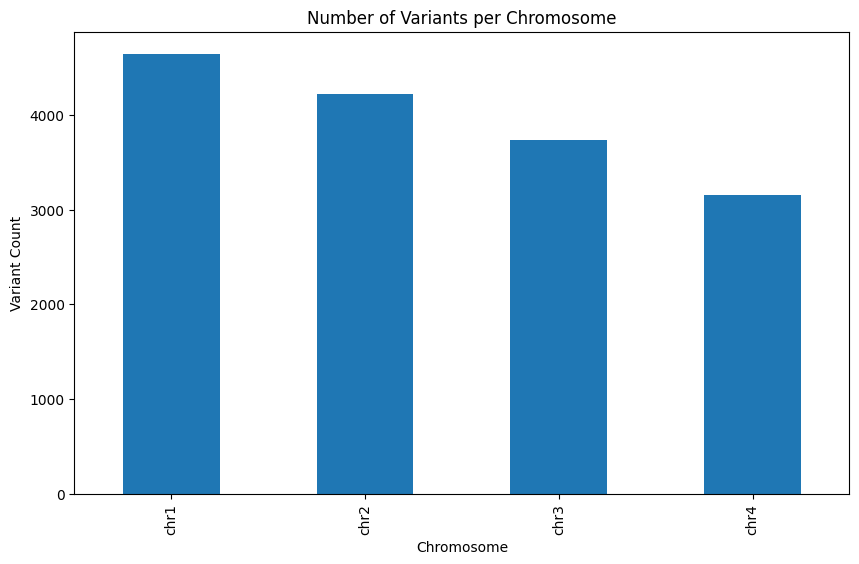

In [62]:
import pandas as pd
import os

# Check if file exists
file_path = "/content/drive/MyDrive/CRISPR2.Variants.vcf"
if not os.path.isfile(file_path):
    print(f"File {file_path} does not exist.")
else:
    # Attempt to read the file with proper settings
    try:
        # Define columns based on VCF structure
        columns = ['CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'CRISPR1.bam.sorted']

        # Read the VCF file while skipping metadata lines (lines starting with '##')
        df = pd.read_csv(file_path, delimiter='\t', comment='#', header=None, names=columns)

        # Check if the dataframe is empty
        if df.empty:
            print("The DataFrame is empty. Please check the file contents.")
        else:
            # Display the first few rows of the dataframe
            print(df.head())

            # Count variants per chromosome
            chrom_count = df['CHROM'].value_counts()
            print(chrom_count)

            # Plot the variant count per chromosome
            import matplotlib.pyplot as plt
            chrom_count.plot(kind='bar', figsize=(10, 6))
            plt.title('Number of Variants per Chromosome')
            plt.xlabel('Chromosome')
            plt.ylabel('Variant Count')
            plt.xticks(rotation=90)
            plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")


In [63]:
import pandas as pd
import os

# Check if file exists
file_path = "/content/drive/MyDrive/CRISPR1.Variants.vcf"
if not os.path.isfile(file_path):
    print(f"File {file_path} does not exist.")
else:
    # Attempt to read the file with proper settings
    try:
        # Define columns based on VCF structure
        columns = ['CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'CRISPR1.bam.sorted']

        # Read the VCF file while skipping metadata lines (lines starting with '##')
        df = pd.read_csv(file_path, delimiter='\t', comment='#', header=None, names=columns)

        # Check if the dataframe is empty
        if df.empty:
            print("The DataFrame is empty. Please check the file contents.")
        else:
            # Display the first few rows of the dataframe
            print(df.head())

            # Count variants per chromosome
            chrom_count = df['CHROM'].value_counts()
            print(chrom_count)

            # Plot the variant count per chromosome
            import matplotlib.pyplot as plt
            chrom_count.plot(kind='bar', figsize=(10, 6))
            plt.title('Number of Variants per Chromosome')
            plt.xlabel('Chromosome')
            plt.ylabel('Variant Count')
            plt.xticks(rotation=90)
            plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")


The DataFrame is empty. Please check the file contents.


In [ ]:
import pandas as pd

# Convert VCF to Pandas DataFrame
data = []
for record in vcf:
    data.append({
        'CHROM': record.CHROM,
        'POS': record.POS,
        'ID': record.ID,
        'REF': record.REF,
        'ALT': record.ALT
    })

# Create DataFrame
df = pd.DataFrame(data)
print(df)


Empty DataFrame
Columns: []
Index: []


In [ ]:
# Target mutation positions on chromosome 2
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Example VCF record (simulating a mutation record)
vcf_record = {'CHROM': '2', 'POS': '36937210', 'REF': 'A', 'ALT': 'T', 'QUAL': '99.0', 'FILTER': 'PASS'}

# Check if POS is in the target positions list
if str(vcf_record['POS']) in cr_target_positions:
    print("Intended Mutation Found:", vcf_record)
else:
    print("No match")


Intended Mutation Found: {'CHROM': '2', 'POS': '36937210', 'REF': 'A', 'ALT': 'T', 'QUAL': '99.0', 'FILTER': 'PASS'}


#**4.5 Data Visualization**

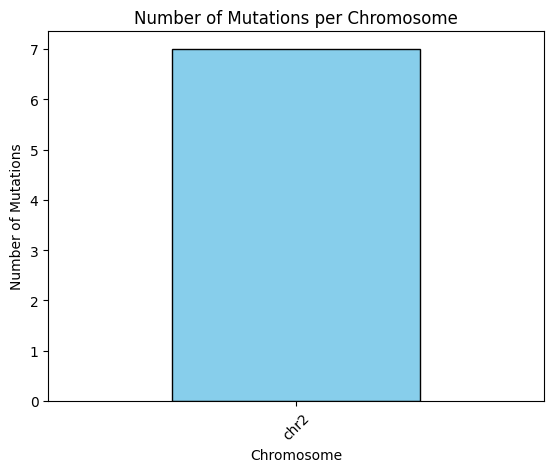

In [ ]:
import matplotlib.pyplot as plt

# Group by 'CHROM' and count mutations per chromosome
mutation_count_per_chrom = intended_mutations_df.groupby('CHROM').size()

# Plot a bar chart
mutation_count_per_chrom.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of Mutations per Chromosome')
plt.xlabel('Chromosome')
plt.ylabel('Number of Mutations')
plt.xticks(rotation=45)
plt.show()


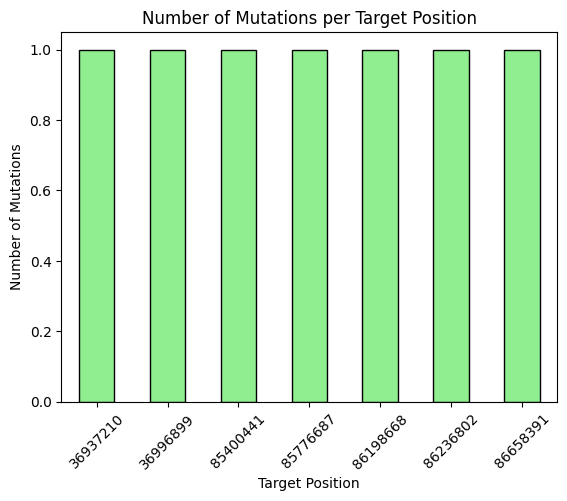

In [ ]:
# Group by 'POS' (target positions) and count mutations at each position
mutation_count_per_pos = intended_mutations_df.groupby('POS').size()

# Plot a bar chart
mutation_count_per_pos.plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title('Number of Mutations per Target Position')
plt.xlabel('Target Position')
plt.ylabel('Number of Mutations')
plt.xticks(rotation=45)
plt.show()


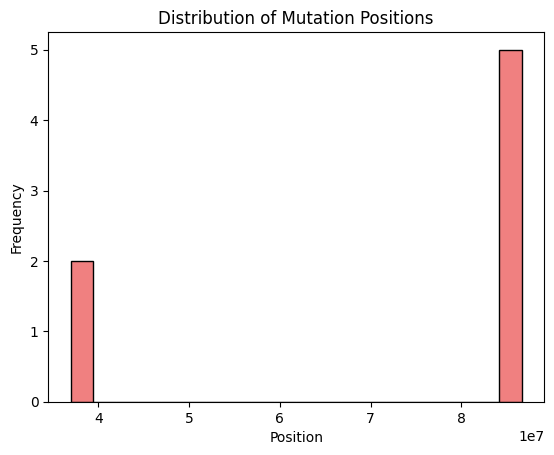

In [ ]:
# Plot a histogram of the mutation positions (POS)
plt.hist(intended_mutations_df['POS'], bins=20, color='lightcoral', edgecolor='black')
plt.title('Distribution of Mutation Positions')
plt.xlabel('Position')
plt.ylabel('Frequency')
plt.show()


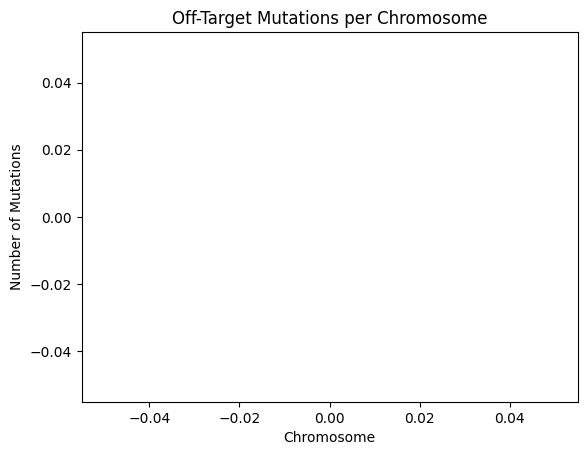

In [36]:
#Last Step Make A Graph

import matplotlib.pyplot as plt

# Plot off-target mutations per chromosome
plt.bar(summary_df["CHROM"], summary_df["Mutation Count"])
plt.xlabel("Chromosome")
plt.ylabel("Number of Mutations")
plt.title("Off-Target Mutations per Chromosome")
plt.show()


IndexError: index 0 is out of bounds for axis 0 with size 0

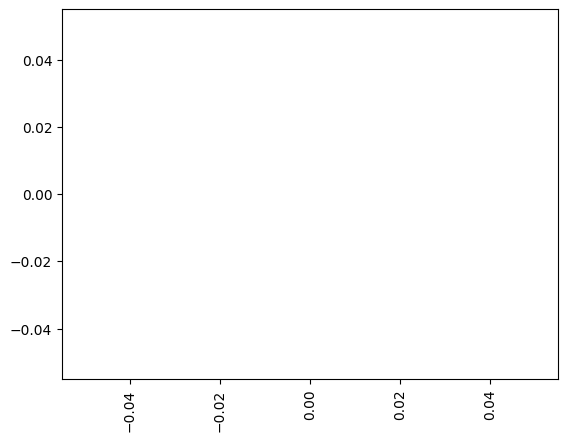

In [37]:
import matplotlib.pyplot as plt

# Group by 'CHROM' and count mutations per chromosome
mutation_count_per_chrom = intended_mutations_df.groupby('CHROM').size()

# Plot a bar chart
mutation_count_per_chrom.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of Mutations per Chromosome')
plt.xlabel('Chromosome')
plt.ylabel('Number of Mutations')
plt.xticks(rotation=45)
plt.show()


#**5. Google Drive Pipeline**
Assume all the files from the *optional* sections above are are located on the Google Drive and the pathway is properly set up.

This addition to the pipeline is useful when utilizing the mounted drive and downloading the files onto your Google Drive. Situations may occur when the entire program restarts on you, or use this method if you cannot downloaded the 3 files:
- CRISPR.R1.fastq
- CRISPR.R2.fastq
- MM10.tar.gz

from up above. Be sure to check that the files are properly called On the google drive. Common Problem is as followed:
## Scenario 1
"Well now I can't download the files anymore due to "Too many users" so here is my work around."
## Scenario 2
"When everything breaks simutanously and the page refreshes which deletes all previously ran/saved files. You have nothing downloaded and must restart from the begininning of the pipeline."

RUN THE CELLs DOWN BELOW AS IT CONNECTS TO YOUR GOOGLE DRIVE

In [46]:
#START: Google Drive Pipeline
# Import files to pipeline
# Connects to a file from your GOOGLE DRIVE
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Packages from 4.1a**

RUN THE CELL DOWN BELOW TO INSTALL PACKAGES

In [5]:
# Install required packages
!apt install bwa samtools bcftools -y  # Install sequence alignment and variant tools
!pip install cyvcf2 pandas pysam matplotlib  # Install Python libraries for VCF handling, data analysis, BAM, and visualization
# Import necessary libraries
import cyvcf2  # For working with VCF files
import pandas as pd  # For handling data in DataFrame
import matplotlib.pyplot as plt  # For visualizations


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libhts3 libhtscodecs2
Suggested packages:
  python3-numpy python3-matplotlib texlive-latex-recommended cwltool
The following NEW packages will be installed:
  bcftools bwa libhts3 libhtscodecs2 samtools
0 upgraded, 5 newly installed, 0 to remove and 49 not upgraded.
Need to get 1,855 kB of archives.
After this operation, 5,096 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libhtscodecs2 amd64 1.1.1-3 [53.2 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libhts3 amd64 1.13+ds-2build1 [390 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 bcftools amd64 1.13-1 [697 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 bwa amd64 0.7.17-6 [195 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/universe amd64 samtools amd64 1.13-4 [520 kB]
Fetched 1,

#**5.1 Verification Check**
This section verifies the files are properly connected.:


#**5.1a FASTQ Verification**

In [4]:
with open('/content/drive/MyDrive/CRISPR.R1.fastq', 'r') as fastq1file:
  print(fastq1file.readline())  # Print first line of CRISPR.R1.fastq

@SRRCrispr.1



In [5]:
with open('/content/drive/MyDrive/CRISPR.R2.fastq', 'r') as fastq2file:
  print(fastq2file.readline())  # Print first line of CRISPR.R2.fastq

@SRRCrispr.1



#**5.1b BAM.SORTED Verification**

In [6]:
### List the contents of the specified file
!ls /content/drive/MyDrive/CRISPR1.bam.sorted

/content/drive/MyDrive/CRISPR1.bam.sorted


In [7]:
### List the contents of the specified file
!ls /content/drive/MyDrive/CRISPR2.bam.sorted

/content/drive/MyDrive/CRISPR2.bam.sorted


In [27]:
### View the contents of the BAM file and display the first few lines
!samtools view /content/drive/MyDrive/CRISPR1.bam.sorted | head


SRRCrispr.1	0	chr1	3006751	60	100M	*	0	0	CCAAAATAGAAAAAAAAAAAAAAAAGAGTAACGGAATGGGAAAAAAAAAGAAAGAAAAAAGAAAAAGAAAAGAAAAAGAAAAAGAAAAAAAGCCCCCTTT	CCCCCGGDFFFFGGGGGGC+CFCFGGGCFCFFGGGGFAFC@CCEGGGFCE74>B?FFFGFG7FCBEGFGGGGG@F7FC<9FFF@<:DF>FFEEFC>FFGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:39
SRRCrispr.2	0	chr1	3007201	60	100M	*	0	0	CATTCTTCTCAGTTTATTCATACATGTTTTAATTTCCATAGTTTTATTATGTTCCTTTGGGCTTTTTTTCTGCCCCCCCCCCTTTTTGTGCCTTGTGATT	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGFGGGGGGGEG@GGCFGGGGABGGGGGGGGGGGGGGGGGFGGAGGDGGGE:C:CGE:EE?,AGC<	NM:i:0	MD:Z:100	AS:i:100	XS:i:19
SRRCrispr.3	0	chr1	3007351	60	100M	*	0	0	GCAAAGGCTTTCCCAAGTCAAGCCTACTGGAGGTTCTAGGATCCATCACTCTAGCCTTTCCTGAGGATTAGGCTTTTCCCGGAGTTGAGTGTAACTTTTT	CCCCCGGGGGGGGCFGGDFGGGFGFGGGGGGGGGGGGFGGGGGGEGGGGGDGGGGGGGGFGGGGGGGGGGGGGGGEFGGGGEGGGEGGGGGDGEGGGGGA	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.4	0	chr1	3007421	60	100M	*	0	0	GGCTTTTCCCGGAGTTGAGTGTAACTTTTTCCATCAGTTTTAATACATTAAGCAGCTTATCTCTGCTTCATTTTAGAAACCTGTAATCTGTTGCTTTGCC	CCCCCGDFGFFGGGGGEGGGGAGGCEGGGFF

In [3]:
### View the contents of the BAM file and display the first few lines
!samtools view /content/drive/MyDrive/CRISPR2.bam.sorted | head


SRRCrispr.1	16	chr1	3006852	60	100M	*	0	0	CCCCCTTTGATTTTTCTCCTTAAAATATTCGGGCAAGAAAGGATAGATAGAAAGGACATCAAAGTTCAGGTAACAAACTGTGTCTTCATGCCCTGACACA	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:20
SRRCrispr.2	16	chr1	3007321	60	100M	*	0	0	TGAGAATAGATAAGCAGGGACTACTTGTGAGCAAAGGCTTTCCCAAGTCAAGCCTACTGGAGGTTCTAGGATCCATCACTCTAGCCTTTCCTGAGGATTA	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.3	16	chr1	3007485	60	100M	*	0	0	GCTTCATTTTAGAAACCTGTAATCTGTTGCTTTGCCTGCTGTCTGCCCGAGGAACTACAATTCTAACATGCTGTGTTCCTAGTGTATATTCTCAGCGGCT	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.4	16	chr1	3007542	60	100M	*	0	0	CAATTCTAACATGCTGTGTTCCTAGTGTATATTCTCAGCGGCTTCCAGACAAAGCTGCTTGTTCCATCAGCAGTGCATCCAGTACCTGTTGGTGGTCTAT	GGFFGFGFBGGGGCGGGGGGGGGGGGGG

In [36]:
# View the content of the sorted BAM file using samtools
# - The command reads the file 'CRISPR1.bam.sorted' located in Google Drive
# - Outputs the alignments in a human-readable SAM format to the terminal
!samtools view /content/drive/MyDrive/CRISPR1.bam.sorted

Streaming output truncated to the last 5000 lines.
SRRCrispr.2723341	0	chr4	141594177	60	100M	*	0	0	GCGCCAGCACATGGCAGGAAAGAAACTGCACAGCAGGCCAGCAGCAGTGTGCACAATCAGCGTAAGACATCTTCCAGACCCTTCGAGCTCACTTCAGCCT	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:20
SRRCrispr.2723342	0	chr4	141594926	60	100M	*	0	0	TCTTGCTGGTCCTGTATTAAAGCTCTTAATCTTCACAACTATACTTTGAAGTTTTTATGTGACATATCATATTCGTAAGGATCTCTATTGCTAAGAAATT	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:19
SRRCrispr.2723343	0	chr4	141595076	60	100M	*	0	0	AAGAGTCAGGACTCGGGCGCAGGTAGGTGGGTTCCAGAGTCGGCCTGGCACACGGACAGCACTTGATGAATGAGTGACCCCTAGCCTGCCCTTTTCTCCC	CCCCCGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.11356920	16	chr4	141595223	60	8S92M	*	0	0	GAGAGCATCCTCCATTGGAGAGCTGAGGTGTGACTCCAGAGAGTGA

In [37]:
# View the content of the sorted BAM file using samtools - CRISPR2.bam.sorted
!samtools view /content/drive/MyDrive/CRISPR2.bam.sorted


SRRCrispr.1	16	chr1	3006852	60	100M	*	0	0	CCCCCTTTGATTTTTCTCCTTAAAATATTCGGGCAAGAAAGGATAGATAGAAAGGACATCAAAGTTCAGGTAACAAACTGTGTCTTCATGCCCTGACACA	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:20
SRRCrispr.2	16	chr1	3007321	60	100M	*	0	0	TGAGAATAGATAAGCAGGGACTACTTGTGAGCAAAGGCTTTCCCAAGTCAAGCCTACTGGAGGTTCTAGGATCCATCACTCTAGCCTTTCCTGAGGATTA	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.3	16	chr1	3007485	60	100M	*	0	0	GCTTCATTTTAGAAACCTGTAATCTGTTGCTTTGCCTGCTGTCTGCCCGAGGAACTACAATTCTAACATGCTGTGTTCCTAGTGTATATTCTCAGCGGCT	DDDDDDDEEECEDEFFFFDFHHHC;;-#JIIEIJJJJJJIJJJJJIIJJJJJJJJJIJJJJIIIJIJJJJJJJIJJJJJJJJJJJHGHHHGHFFFFFCCC	NM:i:0	MD:Z:100	AS:i:100	XS:i:0
SRRCrispr.4	16	chr1	3007542	60	100M	*	0	0	CAATTCTAACATGCTGTGTTCCTAGTGTATATTCTCAGCGGCTTCCAGACAAAGCTGCTTGTTCCATCAGCAGTGCATCCAGTACCTGTTGGTGGTCTAT	GGFFGFGFBGGGGCGGGGGGGGGGGGGG

#**5.1c VCF Verification**

In [13]:
### List the details of the CRISPR1.Variants.vcf VCF file in the directory
!ls /content/drive/MyDrive/CRISPR1.Variants.vcf

/content/drive/MyDrive/CRISPR1.Variants.vcf


In [12]:
### List the details of the CRISPR2.Variants.vcf file in the directory
!ls /content/drive/MyDrive/CRISPR2.Variants.vcf

/content/drive/MyDrive/CRISPR2.Variants.vcf


In [51]:
#PATHWAYS CHECK:
#If error occurs, pathway or name might be incorrect
#This checks if the files:
# CRISPR1.Variants.vcf
# CRISPR2.Variants.vcf
#Have been downloaded and connected to the driver

with open('/content/drive/MyDrive/CRISPR1.Variants.vcf', 'r') as file1:
  print("CRISPR1 File Content:")

  print(file1.readline())  # Prints the first line of the file

with open('/content/drive/MyDrive/CRISPR2.Variants.vcf', 'r') as file2:
  print("CRISPR2 File Content:")

  print(file2.readline())  # Prints the first line of the file


CRISPR1 File Content:
##fileformat=VCFv4.2

CRISPR2 File Content:
##fileformat=VCFv4.2



In [47]:
from cyvcf2 import VCF

# Path to the VCF file
CRISPR1_vcf_file = '/content/drive/MyDrive/CRISPR1.Variants.vcf'

# Create a VCF reader object
vcf_reader = VCF(CRISPR1_vcf_file)

# Loop through each variant and print some information
for variant in vcf_reader:
    print(f"Chromosome: {variant.CHROM}, Position: {variant.POS}, REF: {variant.REF}, ALT: {variant.ALT}")


with open(CRISPR1_vcf_file) as f:
    from google.colab import files



In [49]:
# Path to the VCF file
CRISPR2_vcf_file = '/content/drive/MyDrive/CRISPR2.Variants.vcf'

with open(CRISPR2_vcf_file) as f:
    print("CRISPR2 File Content:")
    print(f.read(1000))  # Print first 1000 characters


CRISPR2 File Content:
##fileformat=VCFv4.2
##FILTER=<ID=PASS,Description="All filters passed">
##bcftoolsVersion=1.13+htslib-1.13+ds
##bcftoolsCommand=mpileup -f MM10/Mouse.fasta --max-depth 2000 /content/drive/MyDrive/CRISPR2.bam.sorted
##reference=file://MM10/Mouse.fasta
##contig=<ID=chr1,length=195471971>
##contig=<ID=chr2,length=182113224>
##contig=<ID=chr3,length=160039680>
##contig=<ID=chr4,length=156508116>
##contig=<ID=chr5,length=151834684>
##contig=<ID=chr6,length=149736546>
##contig=<ID=chr7,length=145441459>
##contig=<ID=chr8,length=129401213>
##contig=<ID=chr9,length=124595110>
##contig=<ID=chr10,length=130694993>
##contig=<ID=chr11,length=122082543>
##contig=<ID=chr12,length=120129022>
##contig=<ID=chr13,length=120421639>
##contig=<ID=chr14,length=124902244>
##contig=<ID=chr15,length=104043685>
##contig=<ID=chr16,length=98207768>
##contig=<ID=chr17,length=94987271>
##contig=<ID=chr18,length=90702639>
##contig=<ID=chr19,length=61431566>
##contig=<ID=chrM,length=16299>
##co

In [1]:
!bcftools view /content/drive/MyDrive/CRISPR1.Variants.vcf


##fileformat=VCFv4.2
##FILTER=<ID=PASS,Description="All filters passed">
##bcftoolsVersion=1.13+htslib-1.13+ds
##bcftoolsCommand=mpileup -f MM10/Mouse.fasta --max-depth 2000 CRISPR1.bam.sorted
##reference=file://MM10/Mouse.fasta
##contig=<ID=chr1,length=195471971>
##contig=<ID=chr2,length=182113224>
##contig=<ID=chr3,length=160039680>
##contig=<ID=chr4,length=156508116>
##contig=<ID=chr5,length=151834684>
##contig=<ID=chr6,length=149736546>
##contig=<ID=chr7,length=145441459>
##contig=<ID=chr8,length=129401213>
##contig=<ID=chr9,length=124595110>
##contig=<ID=chr10,length=130694993>
##contig=<ID=chr11,length=122082543>
##contig=<ID=chr12,length=120129022>
##contig=<ID=chr13,length=120421639>
##contig=<ID=chr14,length=124902244>
##contig=<ID=chr15,length=104043685>
##contig=<ID=chr16,length=98207768>
##contig=<ID=chr17,length=94987271>
##contig=<ID=chr18,length=90702639>
##contig=<ID=chr19,length=61431566>
##contig=<ID=chrM,length=16299>
##contig=<ID=chrX,length=171031299>
##contig=<ID=

In [2]:
!bcftools view /content/drive/MyDrive/CRISPR2.Variants.vcf

Streaming output truncated to the last 5000 lines.
chr3	84213037	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213040	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213043	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213047	.	C	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84213050	.	T	A	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=34	GT:PL	1:34,0
chr3	84357793	.	A	T	3.7766	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:31,0
chr3	84380056	.	G	C	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:34,0
chr3	84391407	.	C	G	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0
chr3	84517045	.	A	T	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0
chr3	84517049	.	A	T	8.99921	.	DP

In [3]:
!grep '^##' /content/drive/MyDrive/CRISPR1.Variants.vcf


##fileformat=VCFv4.2
##FILTER=<ID=PASS,Description="All filters passed">
##bcftoolsVersion=1.13+htslib-1.13+ds
##bcftoolsCommand=mpileup -f MM10/Mouse.fasta --max-depth 2000 CRISPR1.bam.sorted
##reference=file://MM10/Mouse.fasta
##contig=<ID=chr1,length=195471971>
##contig=<ID=chr2,length=182113224>
##contig=<ID=chr3,length=160039680>
##contig=<ID=chr4,length=156508116>
##contig=<ID=chr5,length=151834684>
##contig=<ID=chr6,length=149736546>
##contig=<ID=chr7,length=145441459>
##contig=<ID=chr8,length=129401213>
##contig=<ID=chr9,length=124595110>
##contig=<ID=chr10,length=130694993>
##contig=<ID=chr11,length=122082543>
##contig=<ID=chr12,length=120129022>
##contig=<ID=chr13,length=120421639>
##contig=<ID=chr14,length=124902244>
##contig=<ID=chr15,length=104043685>
##contig=<ID=chr16,length=98207768>
##contig=<ID=chr17,length=94987271>
##contig=<ID=chr18,length=90702639>
##contig=<ID=chr19,length=61431566>
##contig=<ID=chrM,length=16299>
##contig=<ID=chrX,length=171031299>
##contig=<ID=

In [4]:
!grep '^##' /content/drive/MyDrive/CRISPR2.Variants.vcf


##fileformat=VCFv4.2
##FILTER=<ID=PASS,Description="All filters passed">
##bcftoolsVersion=1.13+htslib-1.13+ds
##bcftoolsCommand=mpileup -f MM10/Mouse.fasta --max-depth 2000 /content/drive/MyDrive/CRISPR2.bam.sorted
##reference=file://MM10/Mouse.fasta
##contig=<ID=chr1,length=195471971>
##contig=<ID=chr2,length=182113224>
##contig=<ID=chr3,length=160039680>
##contig=<ID=chr4,length=156508116>
##contig=<ID=chr5,length=151834684>
##contig=<ID=chr6,length=149736546>
##contig=<ID=chr7,length=145441459>
##contig=<ID=chr8,length=129401213>
##contig=<ID=chr9,length=124595110>
##contig=<ID=chr10,length=130694993>
##contig=<ID=chr11,length=122082543>
##contig=<ID=chr12,length=120129022>
##contig=<ID=chr13,length=120421639>
##contig=<ID=chr14,length=124902244>
##contig=<ID=chr15,length=104043685>
##contig=<ID=chr16,length=98207768>
##contig=<ID=chr17,length=94987271>
##contig=<ID=chr18,length=90702639>
##contig=<ID=chr19,length=61431566>
##contig=<ID=chrM,length=16299>
##contig=<ID=chrX,length=1

In [53]:
from cyvcf2 import VCF

# Path to the VCF file
CRISPR2_vcf_file = '/content/drive/MyDrive/CRISPR2.Variants.vcf'

# Create a VCF reader object
CRISPR2_vcf_reader = VCF(CRISPR2_vcf_file)

# Loop through each variant and print some information
for variant in CRISPR2_vcf_reader:
    print(f"Chromosome: {variant.CHROM}, Position: {variant.POS}, REF: {variant.REF}, ALT: {variant.ALT}")


Streaming output truncated to the last 5000 lines.
Chromosome: chr3, Position: 84213047, REF: C, ALT: ['A']
Chromosome: chr3, Position: 84213050, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84357793, REF: A, ALT: ['T']
Chromosome: chr3, Position: 84380056, REF: G, ALT: ['C']
Chromosome: chr3, Position: 84391407, REF: C, ALT: ['G']
Chromosome: chr3, Position: 84517045, REF: A, ALT: ['T']
Chromosome: chr3, Position: 84517049, REF: A, ALT: ['T']
Chromosome: chr3, Position: 84517054, REF: A, ALT: ['T']
Chromosome: chr3, Position: 84517066, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84555106, REF: G, ALT: ['C']
Chromosome: chr3, Position: 84578407, REF: A, ALT: ['T']
Chromosome: chr3, Position: 84649940, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84785557, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84810767, REF: G, ALT: ['C']
Chromosome: chr3, Position: 84856343, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84856345, REF: T, ALT: ['A']
Chromosome: chr3, Position: 84856350,

In [34]:
from cyvcf2 import VCF

try:
    vcf1 = VCF(CRISPR1_vcf_file)
    print(f"CRISPR1 Variants: {[v.POS for v in vcf1]}")
except Exception as e:
    print(f"Error reading CRISPR1: {e}")

try:
    vcf2 = VCF(CRISPR2_vcf_file)
    print(f"CRISPR2 Variants: {[v.POS for v in vcf2]}")
except Exception as e:
    print(f"Error reading CRISPR2: {e}")


CRISPR1 Variants: []
CRISPR2 Variants: [3013991, 3365726, 3408880, 3438070, 3441381, 3441382, 3692689, 3692695, 3692697, 3692699, 3692703, 3692705, 3692706, 3713208, 3713216, 3713217, 3713231, 3758429, 3779522, 3854403, 3854407, 3854419, 3857181, 4007197, 4007201, 4060370, 4095931, 4137715, 4137719, 4137721, 4137726, 4207528, 4207531, 4207532, 4207534, 4207538, 4207539, 4217356, 4217359, 4217367, 4217368, 4217371, 4276896, 4293755, 4366805, 4490235, 4521126, 4524530, 4525680, 4525914, 4542596, 4542603, 4542604, 4542607, 4542612, 4542615, 4570629, 4622063, 4657406, 4657414, 4667827, 4688069, 4688086, 4688095, 4691451, 4756822, 4760834, 4832309, 4868052, 4941152, 4941162, 4941165, 4941168, 4968897, 4990851, 5135052, 5141402, 5162599, 5175388, 5234521, 5333038, 5333042, 5333043, 5333048, 5374527, 5450635, 5600184, 5644226, 5736471, 5736472, 5736480, 5736481, 5794602, 6055052, 6159461, 6225398, 6226537, 6245360, 6245362, 6252316, 6252317, 6330865, 6380534, 6380591, 6382844, 6382847, 638286

#**5.2 Dataframe for Intended Mutation**

In [67]:
import cyvcf2
import pandas as pd

# Load the VCF file containing the CRISPR data
CRISPR1_Variants_vcf_file = '/content/drive/MyDrive/CRISPR1.Variants.vcf'
vcf1 = cyvcf2.VCF(CRISPR1_Variants_vcf_file)

# Target mutation positions on chromosome 2
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Extract mutations corresponding to the target positions
intended_mutations_CRISPR1 = []

for record in vcf1:
    if str(record.POS) in cr_target_positions:
        genotype = record.gt_types[0]  # Get genotype of the first sample (if you have multiple samples, you can loop over them)
        intended_mutations_CRISPR1.append({
            'CHROM': record.CHROM,
            'POS': record.POS,
            'REF': record.REF,
            'ALT': record.ALT,
            'QUAL': record.QUAL,
            'FILTER': record.FILTER,
            'GENOTYPE': genotype  # Add genotype column
        })

# Create a DataFrame of the intended mutations
CRISPR1_intended_mutations_df = pd.DataFrame(intended_mutations_CRISPR1)
print("CRISPR1.Variants.vcf~Intended Mutations DataFrame:")
print(CRISPR1_intended_mutations_df)


CRISPR1.Variants.vcf~Intended Mutations DataFrame:
Empty DataFrame
Columns: []
Index: []


In [68]:
import cyvcf2
import pandas as pd

# Load the VCF file containing the CRISPR data
CRISPR2_Variants_vcf_file = '/content/drive/MyDrive/CRISPR2.Variants.vcf'
vcf2 = cyvcf2.VCF(CRISPR2_Variants_vcf_file)

# Target mutation positions on chromosome 2
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Extract mutations corresponding to the target positions
CRISPR2_intended_mutations = []

for record in vcf2:
    if str(record.POS) in cr_target_positions:
        genotype = record.gt_types[0]  # Get genotype of the first sample (if you have multiple samples, you can loop over them)
        CRISPR2_intended_mutations.append({
            'CHROM': record.CHROM,
            'POS': record.POS,
            'REF': record.REF,
            'ALT': record.ALT,
            'QUAL': record.QUAL,
            'FILTER': record.FILTER,
            'GENOTYPE': genotype  # Add genotype column
        })

# Create a DataFrame of the intended mutations
CRISPR2_intended_mutations_df = pd.DataFrame(CRISPR2_intended_mutations)
print("CRISPR2.Variants.vcf~Intended Mutations DataFrame:")
print(CRISPR2_intended_mutations_df)


CRISPR2.Variants.vcf~Intended Mutations DataFrame:
  CHROM       POS     REF        ALT        QUAL FILTER  GENOTYPE
0  chr2  36937210       C        [T]  127.195999   None         3
1  chr2  36996899  CTTTTT  [CTTTTTT]  120.194000   None         3
2  chr2  85400441       A        [G]  121.208000   None         3
3  chr2  85776687       T        [A]  146.416000   None         3
4  chr2  86198668       A        [G]  124.247002   None         3
5  chr2  86236802      CT      [CTT]  118.134003   None         3
6  chr2  86658391       C       [CG]   93.415100   None         3


#**5.3 Dataframe for Off Target**

In [54]:
import cyvcf2
import pandas as pd

# Load the VCF file containing the CRISPR data
CRISPR_Variants_vcf_file = '/content/drive/MyDrive/CRISPR1.Variants.vcf'
vcf_reader = cyvcf2.VCF(CRISPR_Variants_vcf_file)

# Target mutation positions on chromosome 2
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Initialize lists for intended and off-target mutations
intended_mutations = []
off_target_mutations = []

# Loop through each variant in the VCF file
for variant in vcf_reader:
    # Check if the mutation position matches a target position
    if str(variant.POS) in cr_target_positions:
        intended_mutations.append({
            'CHROM': variant.CHROM,
            'POS': variant.POS,
            'REF': variant.REF,
            'ALT': ','.join(variant.ALT or ['.']),
            'QUAL': variant.QUAL or '.',
            'FILTER': variant.FILTER or '.',

        })
    else:
        off_target_mutations.append({
            'CHROM': variant.CHROM,
            'POS': variant.POS,
            'REF': variant.REF,
            'ALT': ','.join(variant.ALT or ['.']),
            'QUAL': variant.QUAL or '.',
            'FILTER': variant.FILTER or '.',
        })

# Create DataFrames for intended and off-target mutations
intended_mutations_df = pd.DataFrame(intended_mutations)
off_target_mutations_df = pd.DataFrame(off_target_mutations)

# Save the off-target mutations DataFrame to a CSV file (optional)
off_target_mutations_df.to_csv('OffTarget_Mutations.csv', index=False)

# Print a summary of the off-target mutations
print("Off-Target Mutations DataFrame:")
print(off_target_mutations_df)


Off-Target Mutations DataFrame:
Empty DataFrame
Columns: []
Index: []


In [53]:
import cyvcf2
import pandas as pd

# Load the VCF file containing the CRISPR data
CRISPR_Variants_vcf_file = '/content/drive/MyDrive/CRISPR2.Variants.vcf'
vcf_reader = cyvcf2.VCF(CRISPR_Variants_vcf_file)

# Target mutation positions on chromosome 2
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Initialize lists for intended and off-target mutations
intended_mutations = []
off_target_mutations = []

# Loop through each variant in the VCF file
for variant in vcf_reader:
    # Check if the mutation position matches a target position
    if str(variant.POS) in cr_target_positions:
        intended_mutations.append({
            'CHROM': variant.CHROM,
            'POS': variant.POS,
            'REF': variant.REF,
            'ALT': ','.join(variant.ALT or ['.']),
            'QUAL': variant.QUAL or '.',
            'FILTER': variant.FILTER or '.',

        })
    else:
        off_target_mutations.append({
            'CHROM': variant.CHROM,
            'POS': variant.POS,
            'REF': variant.REF,
            'ALT': ','.join(variant.ALT or ['.']),
            'QUAL': variant.QUAL or '.',
            'FILTER': variant.FILTER or '.',
        })

# Create DataFrames for intended and off-target mutations
intended_mutations_df = pd.DataFrame(intended_mutations)
off_target_mutations_df = pd.DataFrame(off_target_mutations)

# Save the off-target mutations DataFrame to a CSV file (optional)
off_target_mutations_df.to_csv('OffTarget_Mutations.csv', index=False)

# Print a summary of the off-target mutations
print("Off-Target Mutations DataFrame:")
print(off_target_mutations_df)


Off-Target Mutations DataFrame:
      CHROM        POS REF ALT      QUAL FILTER
0      chr1    3013991   A   G  11.71720      .
1      chr1    3365726   T   A   6.51248      .
2      chr1    3408880   G   C   5.75677      .
3      chr1    3438070   G   C   3.77660      .
4      chr1    3441381   T   A   7.30814      .
...     ...        ...  ..  ..       ...    ...
15732  chr4  142242519   A   T   8.99921      .
15733  chr4  142242528   C   T   8.99921      .
15734  chr4  142284950   C   G   8.99921      .
15735  chr4  142437156   T   A   5.75677      .
15736  chr4  142545375   T   A   3.22451      .

[15737 rows x 6 columns]


#**5.4 Number of mutations and genotypes per chromosome for off-target changes.**

In [50]:
cr_target_positions = ['36937210', '36996899', '85400441', '85776687', '85918029', '86198668', '86236802', '86658391', '87049235']

# Process CRISPR1
vcf1 = VCF(CRISPR1_vcf_file)
filtered1 = [v for v in vcf1 if str(v.POS) in cr_target_positions]
print(f"CRISPR1 Matching Variants: {len(filtered1)}")

# Process CRISPR2
vcf2 = VCF(CRISPR2_vcf_file)
filtered2 = [v for v in vcf2 if str(v.POS) in cr_target_positions]
print(f"CRISPR2 Matching Variants: {len(filtered2)}")


CRISPR1 Matching Variants: 0
CRISPR2 Matching Variants: 7


In [56]:
import cyvcf2
import pandas as pd

# Step 1: Load the VCF file
vcf_file = '/content/drive/MyDrive/CRISPR2.Variants.vcf'  # Replace with your VCF file path
vcf_reader = cyvcf2.VCF(vcf_file)

# Step 2: Define the list of target positions (intended mutations)
cr_target_positions = ['36937210', '36996899', '85400441', '85776687',
                       '85918029', '86198668', '86236802', '86658391', '87049235']

# Step 3: Initialize lists for storing data
intended_mutations = []
off_target_mutations = []

# Step 4: Process each variant in the VCF file
for variant in vcf_reader:
    mutation_data = {
        'CHROM': variant.CHROM,
        'POS': variant.POS,
        'REF': variant.REF,
        'ALT': ','.join(variant.ALT or ['.']),  # Handle ALT alleles
        'QUAL': variant.QUAL or '.',           # Handle missing quality scores
        'FILTER': variant.FILTER or '.',       # Handle missing filter values
    }

    # Check if the mutation is intended (target) or off-target
    if str(variant.POS) in cr_target_positions:
        intended_mutations.append(mutation_data)
    else:
        off_target_mutations.append(mutation_data)

# Step 5: Create DataFrames for intended and off-target mutations
intended_mutations_df = pd.DataFrame(intended_mutations)
off_target_mutations_df = pd.DataFrame(off_target_mutations)

# Step 6: Save DataFrames to files (optional)
intended_mutations_df.to_csv('Intended_Mutations.csv', index=False)
off_target_mutations_df.to_csv('OffTarget_Mutations.csv', index=False)

# Step 7: Display the Off-Target Mutations DataFrame
print("Off-Target Mutations DataFrame:")
print(off_target_mutations_df)


Off-Target Mutations DataFrame:
      CHROM        POS REF ALT      QUAL FILTER
0      chr1    3013991   A   G  11.71720      .
1      chr1    3365726   T   A   6.51248      .
2      chr1    3408880   G   C   5.75677      .
3      chr1    3438070   G   C   3.77660      .
4      chr1    3441381   T   A   7.30814      .
...     ...        ...  ..  ..       ...    ...
15732  chr4  142242519   A   T   8.99921      .
15733  chr4  142242528   C   T   8.99921      .
15734  chr4  142284950   C   G   8.99921      .
15735  chr4  142437156   T   A   5.75677      .
15736  chr4  142545375   T   A   3.22451      .

[15737 rows x 6 columns]


#**5.5 Data Visualization.**

<ipython-input-57-a8a48b5f6512>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mutation_counts.index, y=mutation_counts.values, palette='viridis')


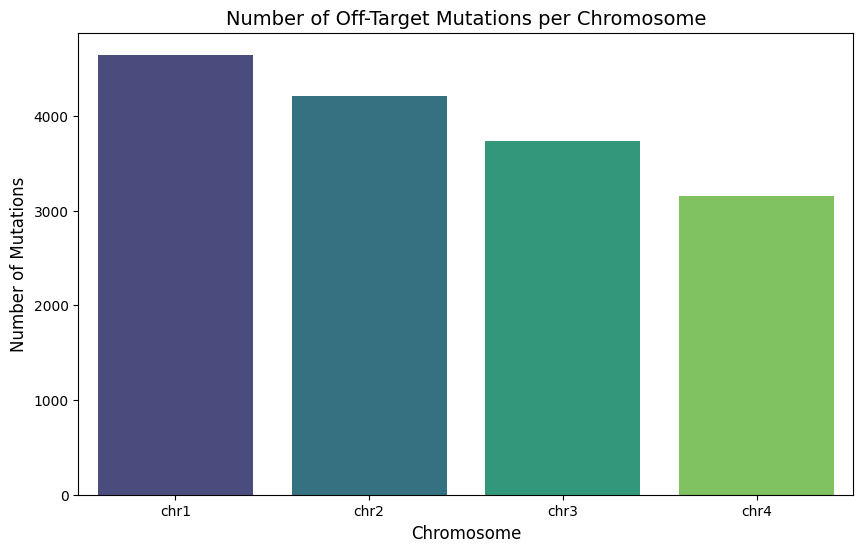

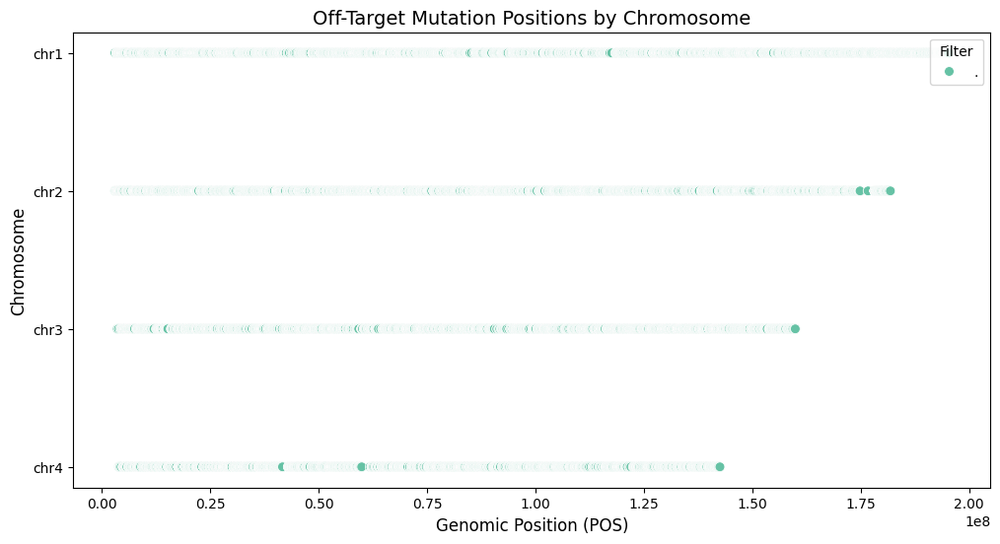

<ipython-input-57-a8a48b5f6512>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=off_target_mutations_df, x='CHROM', y='QUAL', palette='coolwarm')


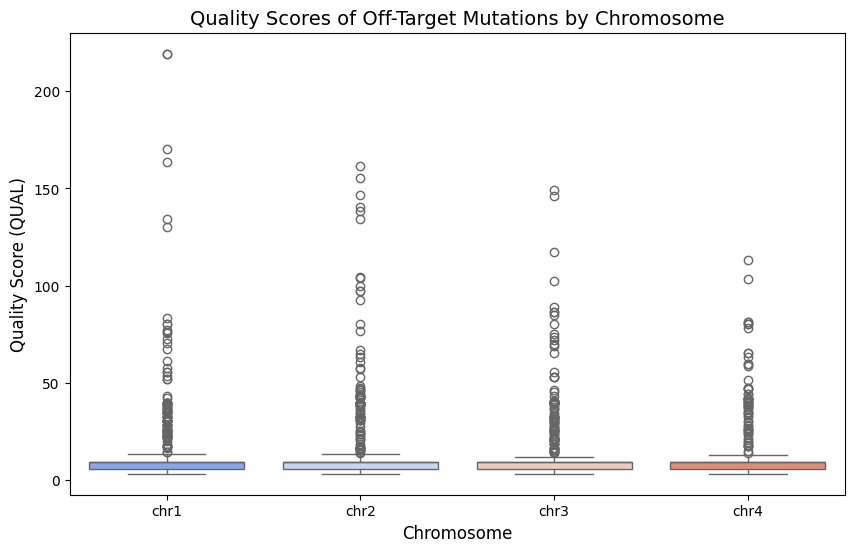

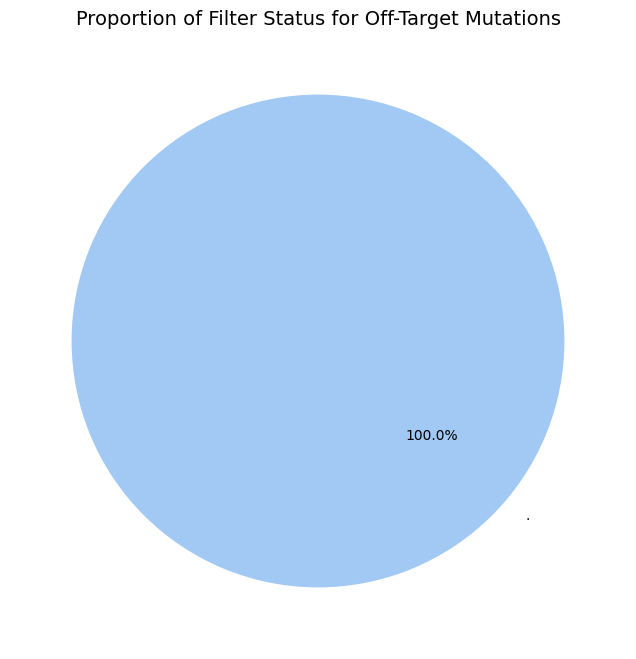

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load the Off-Target Mutations DataFrame (if not already created)
# off_target_mutations_df = pd.read_csv('OffTarget_Mutations.csv')

# Check if the DataFrame is empty
if off_target_mutations_df.empty:
    print("No off-target mutations detected.")
else:
    # Plot 1: Bar Plot - Number of Off-Target Mutations per Chromosome
    mutation_counts = off_target_mutations_df['CHROM'].value_counts()
    plt.figure(figsize=(10, 6))
    sns.barplot(x=mutation_counts.index, y=mutation_counts.values, palette='viridis')
    plt.title("Number of Off-Target Mutations per Chromosome", fontsize=14)
    plt.xlabel("Chromosome", fontsize=12)
    plt.ylabel("Number of Mutations", fontsize=12)
    plt.show()

    # Plot 2: Scatter Plot - Mutation Positions by Chromosome
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=off_target_mutations_df, x='POS', y='CHROM', hue='FILTER', palette='Set2', s=50)
    plt.title("Off-Target Mutation Positions by Chromosome", fontsize=14)
    plt.xlabel("Genomic Position (POS)", fontsize=12)
    plt.ylabel("Chromosome", fontsize=12)
    plt.legend(title="Filter", loc='upper right')
    plt.show()

    # Plot 3: Box Plot - Quality Scores of Off-Target Mutations per Chromosome
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=off_target_mutations_df, x='CHROM', y='QUAL', palette='coolwarm')
    plt.title("Quality Scores of Off-Target Mutations by Chromosome", fontsize=14)
    plt.xlabel("Chromosome", fontsize=12)
    plt.ylabel("Quality Score (QUAL)", fontsize=12)
    plt.show()



#**5.6 Helpful Code**

In [ ]:
#DOWNLOAD FILES FROM GOOGLE DRIVE
from google.colab import files

# Download CRISPR1.bam.sortedbvb
files.download('CRISPR1.bam.sorted')
# Download CRISPR2.bam.sorted
files.download('CRISPR2.bam.sorted')

In [ ]:
# Extracts the contents of the MM10.tar.gz file located in Google Drive to the current working directory

!mkdir -p /content/drive/MyDrive/MM10  # Create a folder for extracted files
!tar -xvf /content/drive/MyDrive/MM10.tar.gz -C /content/drive/MyDrive/MM10
extracted_files = os.listdir('/content/drive/MyDrive/MM10/MM10')

print("Extracted files:", extracted_files)

In [ ]:


# Alternative way 2: Import a file to pipline
# Download a file from your COMPUTER

#This allows you to download any file on your computer, but terrible for downloading any larges files
# from google.colab import files
# uploaded = files.upload()  # This will prompt you to upload files manually

#Verifing
!ls /content/drive/MyDrive/CRISPR.R1.fastq

with open('/content/drive/MyDrive/CRISPR.R1.fastq', 'r') as file:
    print(file.readline())  # Prints the first line of the file

with open('/content/drive/MyDrive/CRISPR.R2.fastq', 'r') as file2:
    print(file2.readline())  # Print first line of CRISPR.R2.fastq
# Extracts the contents of the MM10.tar.gz file located in Google Drive to the current working directory
!tar -xvf /content/drive/MyDrive/MM10.tar.gz


#Option 1:
#align your fastq with refrence for sam files then sam to bam to make it faster
#** Align Fastq **
#Creates fastq -> SAM
!bwa mem mouseref /content/drive/MyDrive/CRISPR.R1.fastq > CRISPR1.sam
!bwa mem mouseref /content/drive/MyDrive/CRISPR.R2.fastq > CRISPR2.sam

#Option 2:
#align your fastq with refrence for sam files then sam to bam to make it faster
#** Align Fastq **
!bwa aln mouseref CRISPR1.R1.fastq > CRISPR1.R1.sam
!bwa aln mouseref CRISPR2.R2.fastq > CRISPR2.R2.sam
!bwa sampe mouseref CRISPR1.R1.sam  CRISPR1.R1.fastq > CRISPR1.bam
!bwa sampe mouseref CRISPR2.R2.sam  CRISPR2.R2.fastq > CRISPR2.bam


#Convert SAM to BAM
!samtools view -bS CRISPR1.sam > CRISPR1.bam
# samtools will sort our bam file however samtools view -bS -q 12 filters the input BAM file
!samtools view -bS -q 12 CRISPR1.bam | samtools sort -o CRISPR1.bam.sorted


#Unzip the vcf file for CRISPR2.Variants.vcf.gz
!gzip -d /content/drive/MyDrive/CRISPR2.Variants.vcf.gz


In [58]:
# Load VCF file
vcf_file2 = "/content/drive/MyDrive/CRISPR2.Variants.vcf"
  # VCF file path


import cyvcf2

# Create a VCF reader object
vcf_file2 = "CRISPR2.Variants.vcf"  # VCF file path
# Create a VCF reader object
vcf_reader2 = cyvcf2.VCF('/content/drive/MyDrive/CRISPR2.Variants.vcf')

vcf_file2= "CRISPR2.Variants.vcf"  # VCF file path
with open('CRISPR2.tsv', 'w') as file:
# Loop through each variant in the VCF file
    for variant in vcf_reader2:
    # Access various properties of the variant
    ### Se note below
        data_string = f"{variant.CHROM}\t{variant.POS}\t{variant.ID}\t{variant.REF}\t{','.join(variant.ALT)}\t{variant.QUAL}\t{variant.FILTER}\t{genotype}\n"
        # Write the data string to the file
        file.write(data_string)

**Align Fastq -> SAM -> BAM**

In [35]:
import cyvcf2

# Load the VCF file
CRISPR1VarVcf = cyvcf2.VCF('/content/drive/MyDrive/CRISPR1.Variants.vcf')

# Print information about the VCF file
for records in CRISPR1VarVcf:
    print(records)

In [36]:
import cyvcf2

# Load the VCF file
CRISPR2VarVcf = cyvcf2.VCF('/content/drive/MyDrive/CRISPR2.Variants.vcf')

# Print information about the VCF file
for record in CRISPR2VarVcf:
    print(record)


Streaming output truncated to the last 5000 lines.
chr4	31021675	.	T	A	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0

chr4	31031196	.	A	T	5.75677	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:34,0

chr4	31062048	.	C	G	8.13869	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:37,0

chr4	31107776	.	T	A	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0

chr4	31166775	.	T	A	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0

chr4	31166776	.	T	A	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=60	GT:PL	1:38,0

chr4	31188536	.	A	T	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=49	GT:PL	1:38,0

chr4	31188537	.	A	T	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=49	GT:PL	1:38,0

chr4	31188539	.	T	G	8.99921	.	DP=1;SGB=-0.379885;FS=0;MQ0F=0;AC=1;AN=1;DP4=0,0,0,1;MQ=49	GT:PL	1:38,0

chr4	31188540	.	C	T	8.

In [40]:
import cyvcf2
import pandas as pd

# Path to the input VCF file
vcf_filePath1 = "/content/drive/MyDrive/CRISPR1.Variants.vcf"

# Create a VCF reader object
vcf_readerPath1 = cyvcf2.VCF(vcf_filePath1)

# Path to output TSV file
output_tsv_file = '/content/drive/MyDrive/CRISPR1.tsv'

# Write data to the TSV file
with open(output_tsv_file, 'w') as Tsvfilesss:
    # Write header to the TSV file
    Tsvfilesss.write("CHROM\tPOS\tID\tREF\tALT\tQUAL\tFILTER\tGENOTYPE\n")

    # Loop through each variant in the VCF file
    for variantsss in vcf_readerPath1:
        # Access various properties of the variant
        genotype = variantsss.gt_types[0]  # Genotype (integer code: 0 = homozygous ref, 1 = het, 2 = homozygous alt, etc.)
        # Create a tab-separated data string
        data_stringsss = f"{variantsss.CHROM}\t{variantsss.POS}\t{variantsss.ID}\t{variantsss.REF}\t{','.join(variantsss.ALT)}\t{variantsss.QUAL}\t{variantsss.FILTER}\t{genotype}\n"
        # Write the data string to the file
        Tsvfilesss.write(data_stringsss)

# Load the VCF data into a DataFrame for analysis
vcf_data1 = pd.read_csv(
    vcf_filePath1, comment='#', sep='\t', header=None,
    names=["CHROM", "POS", "ID", "REF", "ALT", "QUAL", "FILTER", "INFO"]
)

# Print confirmation message
print(f"TSV file created: {output_tsv_file}")


TSV file created: /content/drive/MyDrive/CRISPR1.tsv


In [43]:
import pandas as pd

# Load the TSV file into a DataFrame
tsv_file = '/content/drive/MyDrive/CRISPR2.tsv'
variant_data = pd.read_csv(tsv_file, sep='\t')

# Display the first few rows
print(variant_data.head())

# Example: Filter variants with QUAL > 30
filtered_variants = variant_data[variant_data['QUAL'] > 30]

# Save filtered data to a new file
filtered_variants.to_csv('/content/drive/MyDrive/CRISPR2_filtered.tsv', sep='\t', index=False)
print("Filtered variants saved to CRISPR2_filtered.tsv")


  CHROM      POS  ID REF ALT      QUAL  FILTER  GENOTYPE
0  chr1  3013991 NaN   A   G  11.71720     NaN         3
1  chr1  3365726 NaN   T   A   6.51248     NaN         3
2  chr1  3408880 NaN   G   C   5.75677     NaN         3
3  chr1  3438070 NaN   G   C   3.77660     NaN         3
4  chr1  3441381 NaN   T   A   7.30814     NaN         3
Filtered variants saved to CRISPR2_filtered.tsv


In [44]:
# Load both TSV files into DataFrames
tsv_file1 = '/content/drive/MyDrive/CRISPR1.tsv'
tsv_file2 = '/content/drive/MyDrive/CRISPR2.tsv'

data1 = pd.read_csv(tsv_file1, sep='\t')
data2 = pd.read_csv(tsv_file2, sep='\t')

# Find common variants based on CHROM and POS
common_variants = pd.merge(data1, data2, on=['CHROM', 'POS'], suffixes=('_CRISPR1', '_CRISPR2'))
print(f"Number of common variants: {len(common_variants)}")
common_variants.to_csv('/content/drive/MyDrive/common_variants.tsv', sep='\t', index=False)

# Find unique variants in CRISPR2
unique_variants = data2[~data2[['CHROM', 'POS']].apply(tuple, axis=1).isin(data1[['CHROM', 'POS']].apply(tuple, axis=1))]
print(f"Number of unique variants in CRISPR2: {len(unique_variants)}")
unique_variants.to_csv('/content/drive/MyDrive/unique_variants_CRISPR2.tsv', sep='\t', index=False)


Number of common variants: 0
Number of unique variants in CRISPR2: 15743


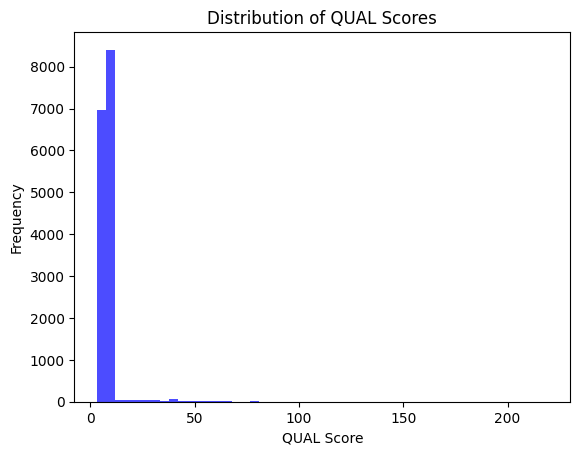

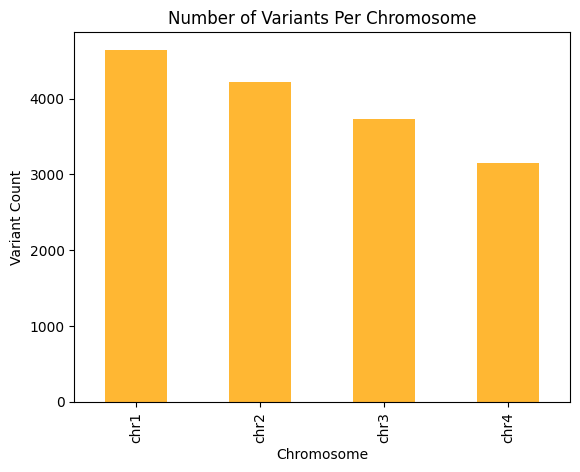

In [45]:
import matplotlib.pyplot as plt

# Load the TSV file into a DataFrame
variant_data = pd.read_csv(tsv_file, sep='\t')

# Plot the distribution of QUAL scores
plt.hist(variant_data['QUAL'], bins=50, color='blue', alpha=0.7)
plt.title('Distribution of QUAL Scores')
plt.xlabel('QUAL Score')
plt.ylabel('Frequency')
plt.show()

# Count the number of variants per chromosome
chromosome_counts = variant_data['CHROM'].value_counts()
chromosome_counts.plot(kind='bar', color='orange', alpha=0.8)
plt.title('Number of Variants Per Chromosome')
plt.xlabel('Chromosome')
plt.ylabel('Variant Count')
plt.show()
